# Information Visualization

# Datasets

To provide inspiration, here are some links where you can find interesting datasets to analyze in your portfolio:
- https://github.com/rfordatascience/tidytuesday 
- https://www.destatis.de/DE/Service/OpenData/_inhalt.html
- https://www.ons.gov.uk/census/planningforcensus2021/ukcensusdata
- https://ec.europa.eu/eurostat/
- https://www.kaggle.com/datasets
- https://data.fivethirtyeight.com/ 
- https://corgis-edu.github.io/corgis/csv/ 
- https://github.com/textmining-infopros/Curated-Datasets
- https://www.data-is-plural.com/ / https://docs.google.com/spreadsheets/d/1wZhPLMCHKJvwOkP4juclhjFgqIY8fQFMemwKL2c64vk


Feel free to use other data sources as well, including own datasets!

# Setup

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Custom color palette:
# The color palette is chosen to ensure that most people can distinguish the colors and that people with a red-green weakness are not influenced too much
pastel_palette = ["#FFB3E6", "#C6A5E0", "#9B9BCE", "#80CED7", "#A2D2FF",
                  "#FFCC99", "#FFFF99", "#B3E6CC", "#FF9999", "#FFCCCC"]
sns.set_palette(pastel_palette)
# You can switch palettes with: sns.set_palette(palette_object)


# Custom context:
# The context 'talk' is chosen over other contexts like 'notebook' to make the data clearer and more easy to read 
sns.set_context('talk')

In [4]:
data_folder = './data/' # adjust to your filesystem / setup, if you like

# Part 1: Foundations of infovis 🚀

Let's get started with exploring some datasets with basic chart types!

To get started, here are the references for the data we use for some examples: 

- "Global air quality data provided by the World Health Organization" | [Source: WHO](https://www.who.int/data/gho/data/themes/air-pollution/who-air-quality-database)

- "WHO regional groupings" by income | [Source: WHO](https://cdn.who.int/media/docs/default-source/air-pollution-documents/air-quality-and-health/country-groupings-database-2022.pdf)

Let's load the dataset and have a first look:

In [5]:
who_air_data = pd.read_csv(data_folder+'who_aap_2021_v9_11august2022.csv', sep=';', decimal=',')
who_air_data.head() # prints the first 5 rows, useful to check what the dataframe looks like

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Reference,Number and type of monitoring stations,Version of the database
0,Eastern Mediterranean Region,AFG,Afghanistan,Kabul,2019,119.77,NaN,NaN,18.0,NaN,NaN,"U.S. Department of State, United States Enviro...",NaN,2022
1,European Region,ALB,Albania,Durres,2015,NaN,17.65,26.63,NaN,NaN,83.961187,European Environment Agency (downloaded in 2021),NaN,2022
2,European Region,ALB,Albania,Durres,2016,14.32,24.56,24.78,NaN,NaN,87.932605,European Environment Agency (downloaded in 2021),NaN,2022
3,European Region,ALB,Albania,Elbasan,2015,NaN,NaN,23.96,NaN,NaN,97.853881,European Environment Agency (downloaded in 2021),NaN,2022
4,European Region,ALB,Albania,Elbasan,2016,NaN,NaN,26.26,NaN,NaN,96.049636,European Environment Agency (downloaded in 2021),NaN,2022


In [6]:
# It's often useful to print the list of column names:
print(who_air_data.columns) 

Index(['WHO Region', 'ISO3', 'WHO Country Name', 'City or Locality',
       'Measurement Year', 'PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference',
       'Number and type of monitoring stations', 'Version of the database'],
      dtype='object')


In [7]:
who_region_income = pd.read_csv(data_folder+'who_country_income_ratings.csv', sep=';')
who_region_income.head()
# "head()" prints the first 5 rows - useful to check what a dataframe looks like

,WHO Country Name,WHO Region,World Bank ranking of income 2019
0,Afghanistan,Eastern Mediterranean,low
1,Albania,European,upper middle
2,Algeria,African,lower middle
3,Andorra,European,high
4,Angola,African,lower middle


In [8]:
print(who_region_income.columns) 

Index(['WHO Country Name', 'WHO Region', 'World Bank ranking of income 2019'], dtype='object')


Here's a basic first plot - a bar chart:

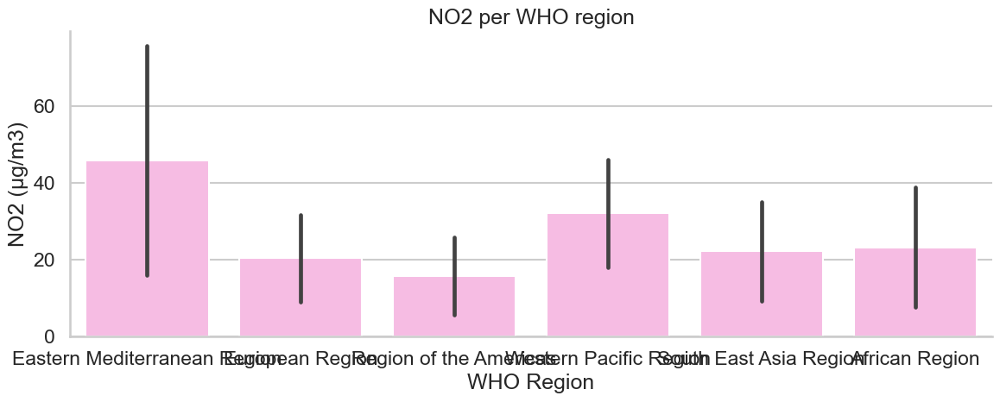

In [9]:
sns.set_palette(pastel_palette)
sns.set_style('whitegrid')
plt.figure(figsize=(12,5))
sns.barplot(data=who_air_data, x="WHO Region", y="NO2 (μg/m3)", errorbar="sd")
plt.title('NO2 per WHO region')
sns.despine()
plt.tight_layout()
plt.xlabel('WHO Region')
plt.ylabel('NO2 (μg/m3)')
plt.show()

Here's another example that uses [geopandas](https://geopandas.org/) to easily integrate a map:

In [10]:
import geopandas as gpd
# With conda you can install it with: conda install -c conda-forge geopandas
# If you want to use pip instead check that dependencies can be installed as well,
# see: https://geopandas.org/en/stable/getting_started/install.html

This library also comes with basic geo-dataframes, such as the world map. Let's have a look:

In [11]:
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
countries.head()

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/2260362665.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


Note that this data also includes information on population and gdp.

Here's an example of merging the geo data with the WHO data:

In [12]:
who_air_data_mean_per_country = who_air_data.groupby(['ISO3'])[['PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)']].mean()
who_air_data_geo = gpd.GeoDataFrame(pd.merge(left=who_air_data_mean_per_country, right=countries[['iso_a3', 'geometry']], left_on='ISO3', right_on='iso_a3', how='left'))

Now we can plot it!

This example also illustrates further useful aspects, such as adding and modifying a colorbar.

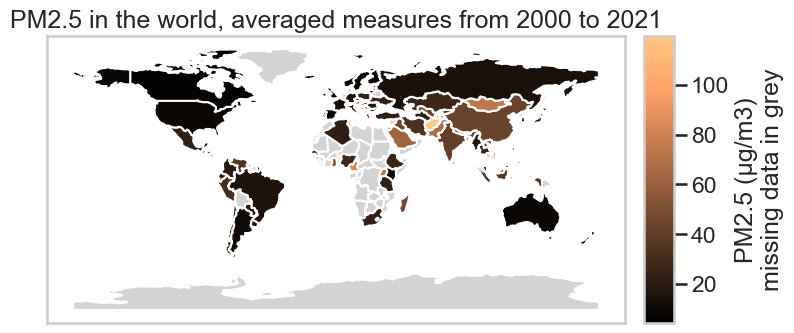

In [13]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Basic setup:
sns.set_style('whitegrid')
fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111)

# Title, include the min and max year (since we averaged the measurements above):
plt.title('PM2.5 in the world, averaged measures from %d to %d' 
    % (who_air_data['Measurement Year'].min(), who_air_data['Measurement Year'].max()))

# Remove ticks, not needed for the world map here:
plt.xticks([])
plt.yticks([])

# Add a colorbar:
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Let's plot the world map in grey first, since not all countries have air measurements:
countries.plot(ax=ax, color='lightgrey')

# Now let's plot the air pollution data on top:
who_air_data_geo[['PM2.5 (μg/m3)', 'geometry']].plot(
    ax=ax, cax=cax, legend=True, column='PM2.5 (μg/m3)', cmap='copper')

# Modify the colorbar a bit to have a useful label:
cax.set_ylabel('PM2.5 (μg/m3)\nmissing data in grey', rotation=90)

plt.tight_layout()
plt.show()                                             

Sidenote: Don't like these colors? You can check out matplotlib's colormaps [here](https://matplotlib.org/2.0.2/users/colormaps.html) and seaborn's color palettes [here](https://seaborn.pydata.org/tutorial/color_palettes.html).

---

To get you started, here are some questions examine:
- What is the relationship between the wealth of a country/region and its air pollution?
- Which countries/regions have the lowest/highest pollution levels? For each pollution type?
- Which cities have the lowest/highest pollution levels? For each pollution type?
- How has pollution developed (in specific cities) over time?
- What is the relationship of population size / country size and pollution?
- etc.

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

In [15]:
data_folder = './data/'

who_air_data = pd.read_csv(data_folder+'who_aap_2021_v9_11august2022.csv', sep=';', decimal=',')
who_region_income = pd.read_csv(data_folder+'who_country_income_ratings.csv', sep=';')

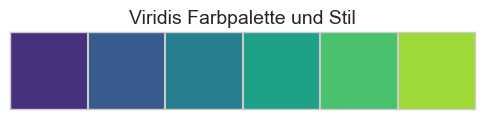

In [16]:
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

plt.rcParams.update({
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 16,
    'figure.figsize': (10, 6)
})

sns.palplot(sns.color_palette("viridis"))
plt.title("Viridis Farbpalette und Stil")
plt.show()

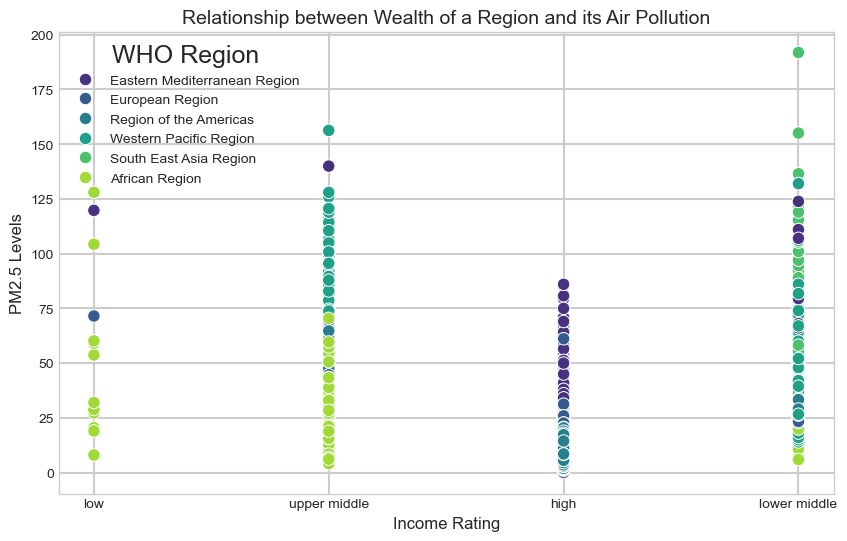

In [17]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 1. aspect/pattern: Relationship between the wealth of a region and its air pollution
# SCATTER PLOT
#-------------------------------------------------------------------------------------------------------------------------------------------------------

# Merge the datasets on the relevant column
merged_data = pd.merge(who_air_data, who_region_income, on='WHO Country Name', how='inner')

plt.figure(figsize=(10, 6))
sns.scatterplot(x='World Bank ranking of income 2019', y='PM2.5 (μg/m3)', data=merged_data, hue='WHO Region_x', palette='viridis')
plt.title('Relationship between Wealth of a Region and its Air Pollution')
plt.xlabel('Income Rating')
plt.ylabel('PM2.5 Levels')
plt.legend(title='WHO Region')
plt.show()

# 💡💡💡💡
# Design:
# Color Palette: The "viridis" palette ensures good distinction between different regions and is colorblind-friendly.
# Axis Labels and Title: Clear labels and title to convey the message of the plot.
# Legend: A legend to indicate the regions, helping in understanding the distribution of data points by region.

# Insights:
# This scatter plot can help identify if there is a trend or correlation between the wealth of a region (measured by income rating) 
# and its air pollution levels (measured by PM2.5 levels).
# By visualizing this relationship, policymakers can understand if wealthier regions 
# have better air quality and if not, identify regions that may need more intervention.

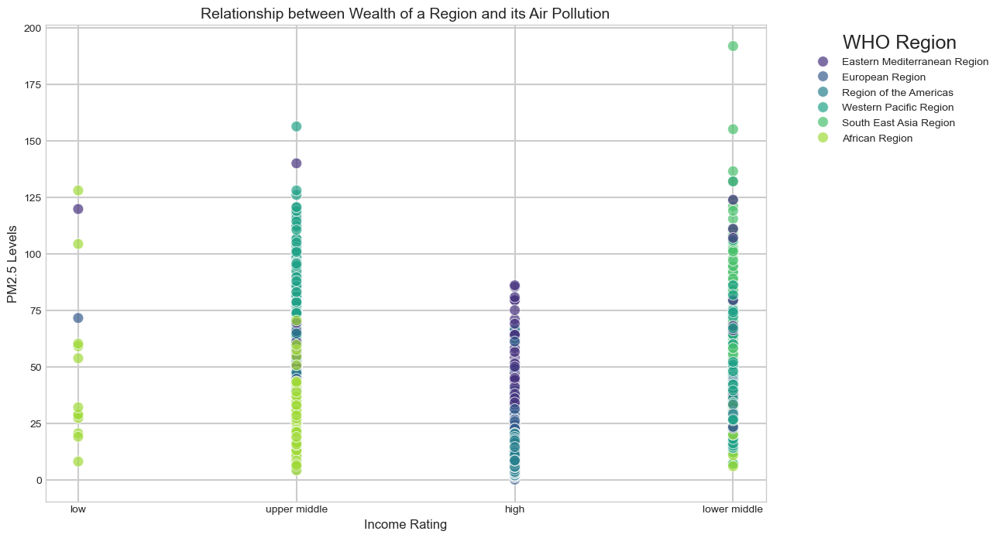

In [18]:
# Merge the datasets on the relevant column
merged_data = pd.merge(who_air_data, who_region_income, on='WHO Country Name', how='inner')

# Scatter plot of wealth (e.g., income rating) vs air pollution (e.g., PM2.5 levels)
plt.figure(figsize=(12, 8))
sns.scatterplot(x='World Bank ranking of income 2019', y='PM2.5 (μg/m3)', data=merged_data, hue='WHO Region_x', palette='viridis', alpha=0.7, s=100)
plt.title('Relationship between Wealth of a Region and its Air Pollution')
plt.xlabel('Income Rating')
plt.ylabel('PM2.5 Levels')

# Place the legend outside the plot
plt.legend(title='WHO Region', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

# 💡💡💡💡
# Improvements:
# Legend Placement: The legend is now placed outside the plot, which leaves more space for the data points and makes the plot less cluttered.
# Increased Label Sizes: The axis labels have been made larger to improve readability.
# Point Overlap Reduction: By adding transparency (alpha=0.7) and increasing the point size (s=100), the overlap of points is reduced, making individual data points more distinguishable.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


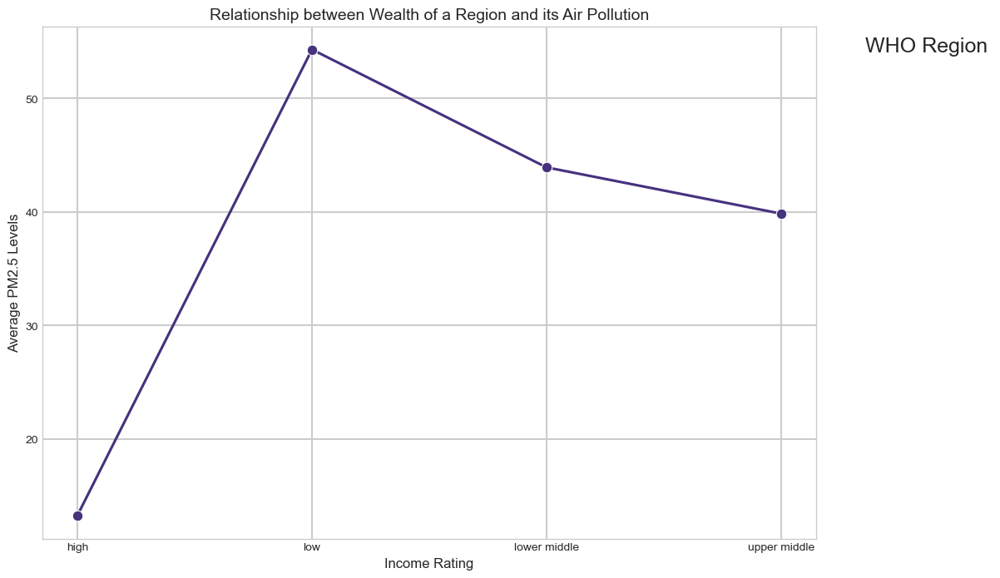

In [19]:
# Aggregate data by income rating to get the average PM2.5 levels
aggregated_data = merged_data.groupby('World Bank ranking of income 2019')['PM2.5 (μg/m3)'].mean().reset_index()

# Line plot of wealth (e.g., income rating) vs average air pollution (e.g., PM2.5 levels)
plt.figure(figsize=(12, 8))
sns.lineplot(x='World Bank ranking of income 2019', y='PM2.5 (μg/m3)', data=aggregated_data, marker='o')
plt.title('Relationship between Wealth of a Region and its Air Pollution')
plt.xlabel('Income Rating')
plt.ylabel('Average PM2.5 Levels')

# Place the legend outside the plot
plt.legend(title='WHO Region', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

# 💡💡💡💡
# Design:
# Aggregation: The data is aggregated by income rating to calculate the average PM2.5 levels for each income group.
# Line Plot with Markers: A line plot with markers (marker='o') is used to clearly show the trend and the individual data points.
# Axis Labels and Title: Clear labels and title to convey the message of the plot.
# Legend Placement: Although not strictly necessary for this plot, the legend is placed outside the plot area to keep the plot clean.

# Insights:
# This line plot helps in visualizing the trend between the wealth of a region and its average air pollution levels.
# It can reveal if higher income regions tend to have lower or higher air pollution levels on average.
# Policymakers can use this information to understand and address air quality issues in different income regions.

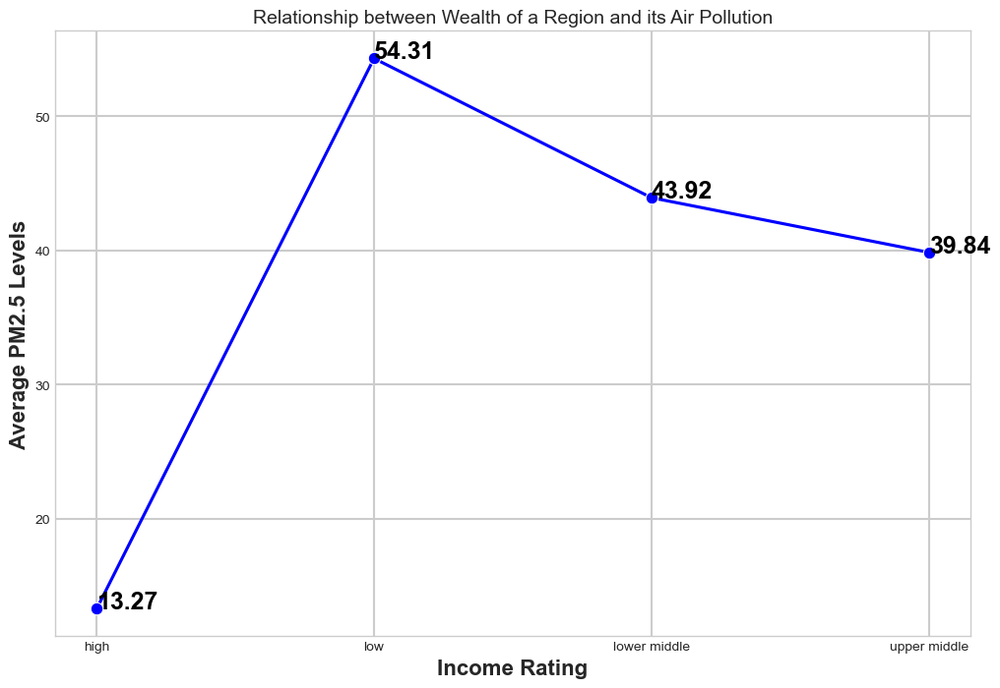

In [20]:
# Aggregate data by income rating to get the average PM2.5 levels
aggregated_data = merged_data.groupby('World Bank ranking of income 2019')['PM2.5 (μg/m3)'].mean().reset_index()

# Create a line plot with additional enhancements
plt.figure(figsize=(12, 8))
line_plot = sns.lineplot(x='World Bank ranking of income 2019', y='PM2.5 (μg/m3)', data=aggregated_data, marker='o', color='b')

# Adding point labels
for line in range(0, aggregated_data.shape[0]):
    line_plot.text(aggregated_data['World Bank ranking of income 2019'][line], 
                   aggregated_data['PM2.5 (μg/m3)'][line], 
                   round(aggregated_data['PM2.5 (μg/m3)'][line], 2), 
                   horizontalalignment='left', 
                   size='medium', 
                   color='black', 
                   weight='semibold')

plt.title('Relationship between Wealth of a Region and its Air Pollution')
plt.xlabel('Income Rating', fontsize=16, weight='bold')  # Increased font size and weight for better visibility
plt.ylabel('Average PM2.5 Levels', fontsize=16, weight='bold')  # Increased font size and weight for better visibility

# Removing the legend as it's not needed for a single line plot
plt.legend([],[], frameon=False)

plt.show()

# 💡💡💡💡
# Improvements:
# Increased Font Size for Axis Labels: The font size of the x- and y-axis labels has been increased to 16 and made bold, making them more prominent and easier to read.
# Point Labels: Added labels to each data point to clearly show the exact PM2.5 levels, making the plot more informative.
# Color Consistency: Used a consistent color scheme to maintain the visual coherence with other plots.
# Legend Removal: Removed the legend as it is not necessary for a single line plot, reducing visual clutter.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/3183195815.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  lineplot = sns.lineplot(data=who_air_data, x='Measurement Year', y='NO2 (μg/m3)', ci=None)


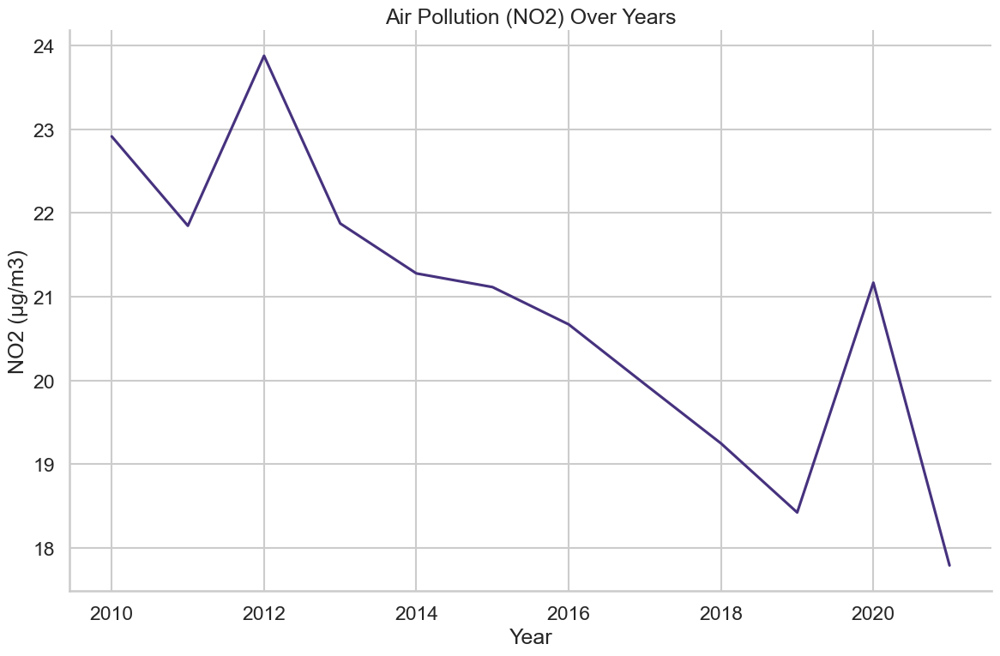

In [21]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 2. aspect/pattern: How has pollution developed over time
# Line Plot 
#-------------------------------------------------------------------------------------------------------------------------------------------------------

# load data
who_air_data = pd.read_csv(data_folder + 'who_aap_2021_v9_11august2022.csv', sep=';', decimal=',')

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
lineplot = sns.lineplot(data=who_air_data, x='Measurement Year', y='NO2 (μg/m3)', ci=None)
plt.title('Air Pollution (NO2) Over Years')
plt.xlabel('Year')
plt.ylabel('NO2 (μg/m3)')
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# Style and Context: The plot uses sns.set_style('whitegrid') to provide a clean background with grid lines, making the data easier to read. 
# The sns.set_context('talk') setting ensures that plot elements are large enough for presentations.
# Despine and Layout: sns.despine() is used to remove the top and right spines for a cleaner look, and plt.tight_layout() ensures 
# that all plot elements fit well within the figure area.

# Insights:
# Trend Over Time: The line plot visualizes the trend in NO2 pollution levels over the years, allowing viewers to observe periods of increase or decrease in pollution.
# Public Awareness: The plot serves to inform the public about long-term trends in air pollution, potentially increasing support for environmental protection measures.

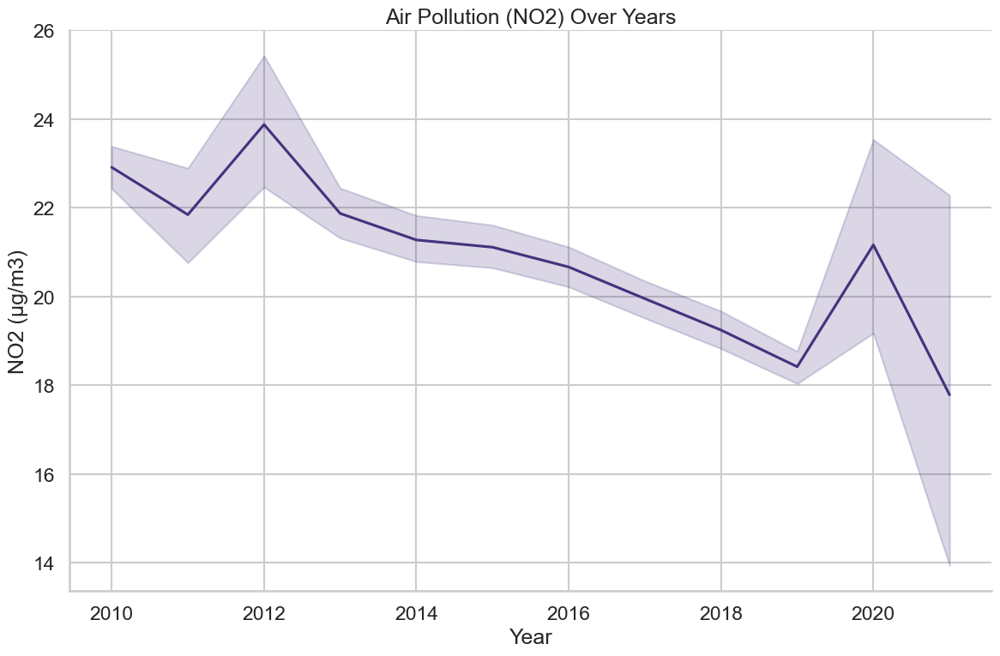

In [22]:
who_air_data = pd.read_csv(data_folder+'who_aap_2021_v9_11august2022.csv', sep=';', decimal=',')

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

who_air_data = pd.read_csv(data_folder + 'who_aap_2021_v9_11august2022.csv', sep=';', decimal=',')

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
lineplot = sns.lineplot(data=who_air_data, x='Measurement Year', y='NO2 (μg/m3)')
plt.title('Air Pollution (NO2) Over Years')
plt.xlabel('Year')
plt.ylabel('NO2 (μg/m3)')
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Improvements:
# Understanding Variability: The confidence interval in the first plot helps viewers understand the range of possible values around the trend line, 
# indicating the level of confidence in the trend observed.
# Additional Insights: The presence of a confidence interval can highlight periods of high variability or uncertainty in the data, which may warrant further investigation.

In [23]:
who_air_data_mean_per_country = who_air_data.groupby(['ISO3'])[['PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)']].mean()
who_air_data_geo = gpd.GeoDataFrame(pd.merge(left=who_air_data_mean_per_country, right=countries[['iso_a3', 'geometry']], left_on='ISO3', right_on='iso_a3', how='left'))

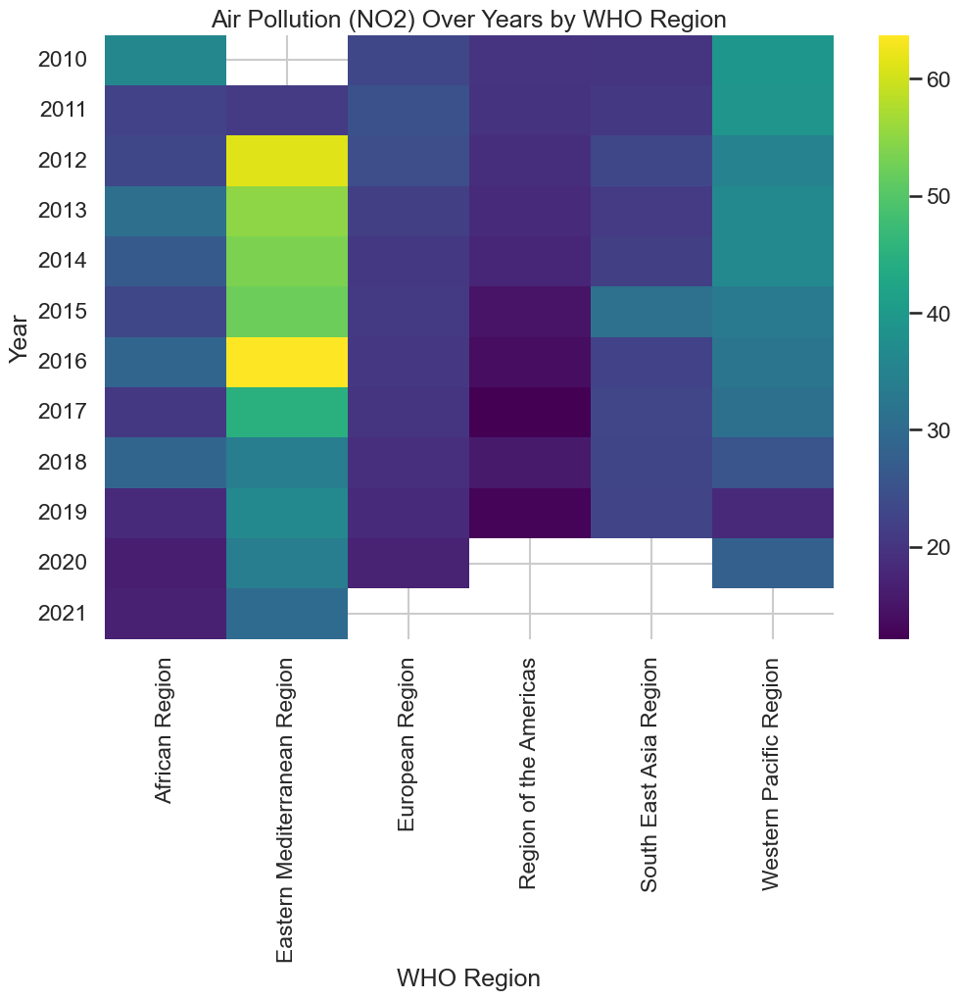

In [24]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 2. aspect/pattern: How has pollution developed over time
# Heat Map
#-------------------------------------------------------------------------------------------------------------------------------------------------------

plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(who_air_data.pivot_table(index='Measurement Year', columns='WHO Region', values='NO2 (μg/m3)'), cmap="viridis")
plt.title('Air Pollution (NO2) Over Years by WHO Region')
plt.xlabel('WHO Region')
plt.ylabel('Year')
plt.yticks(rotation=0)  
plt.show()

# Design:
# Pivot Table: The data is reshaped into a pivot table with 'Measurement Year' as the index, 'WHO Region' as the columns, and 'NO2 (μg/m3)' as the values. 
# This structure is ideal for a heatmap, which can show variations across two dimensions effectively.
# Color Map: The 'viridis' colormap is chosen for its perceptual uniformity and colorblind-friendly properties, 
# ensuring that the heatmap is easy to interpret by a wide audience.

# Insights:
# Regional Trends over time: The heatmap provides a visual representation of how NO2 levels have changed over time in different WHO regions. 
# It allows for easy comparison across regions and years.
# Identifying Patterns: This visualization can help identify patterns and trends, such as periods of high or low pollution, 
# which regions have consistently higher or lower NO2 levels, and any significant changes over time.
# Highlighting Critical Areas:
# The heatmap can highlight regions and time periods with particularly high levels of NO2, signaling the need for further investigation or targeted action.

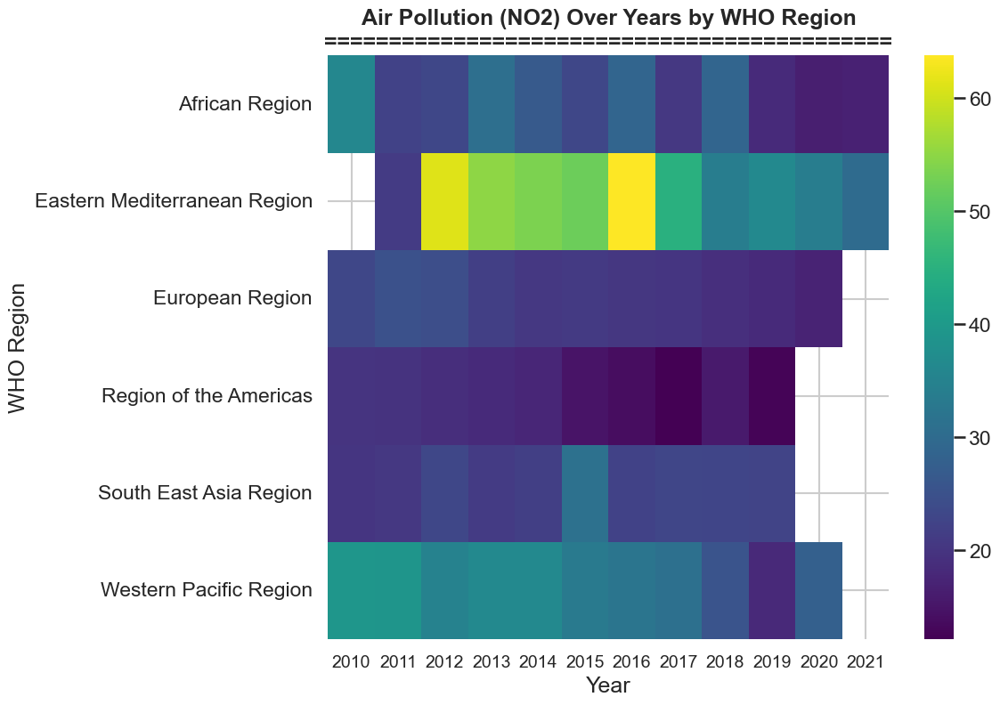

In [25]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 2. aspect/pattern: How has pollution developed over time
# Heat Map (but better)
#-------------------------------------------------------------------------------------------------------------------------------------------------------

plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(who_air_data.pivot_table(index='WHO Region', columns='Measurement Year', values='NO2 (μg/m3)'), cmap="viridis")
plt.title('Air Pollution (NO2) Over Years by WHO Region', weight='bold')  # Mache die Überschrift fett
plt.xlabel('Year')  
plt.ylabel('WHO Region')  
plt.xticks(rotation=0)  
plt.tick_params(axis='x', which='major', labelsize=14)  
plt.tight_layout()

title_text = plt.gca().title
title_text.set_fontweight('bold')
title_text.set_text(title_text.get_text() + '\n' + '=' * len(title_text.get_text()))  

plt.show()

# 💡💡💡💡
# This version of the heat map is even easier to read due to font changes and the changing of the x- and y-axes so so the region names can be displayed horizontaly without laying over each other. 
# Also when visualizaiton something over time to visualize the time on the x-axes from left to right.

# Compared to the line plot this the heat map gives insight into the air pollution for each region, providing even more information.
# With this visualization I wanted to point out the years of high pollution by using a striking color. 
# The viewer can spot differences way easier because difference are shown by color instead of a value on the y axes. The more visual, the better.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/1291473849.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/1291473849.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  who_air_pollution_selected.rename(columns={'ISO3': 'iso_a3'}, inplace=True)


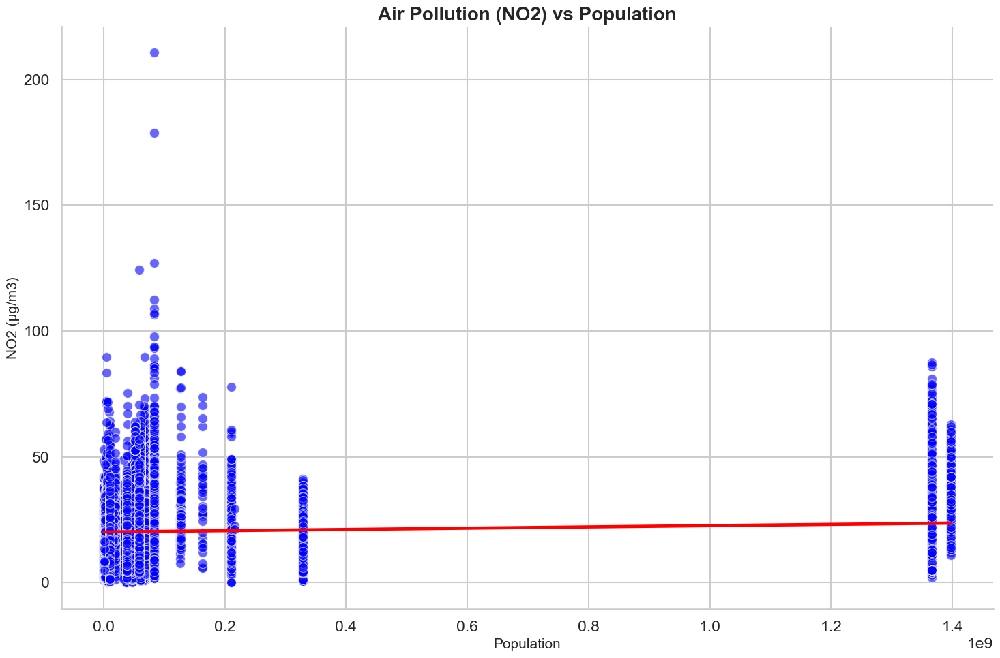

In [26]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 3. aspect/pattern: Relationship between air pollution and population
# Scatter Plot
#-------------------------------------------------------------------------------------------------------------------------------------------------------

# import geo data
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# take only necessary data from both data sets
who_air_pollution_selected = who_air_data[['ISO3', 'NO2 (μg/m3)']]
countries_selected = countries[['iso_a3', 'pop_est']]

# change name 'ISO3' to 'iso_a3' to merge them 
who_air_pollution_selected.rename(columns={'ISO3': 'iso_a3'}, inplace=True)

# merge the selected data sets
combined_data = pd.merge(who_air_pollution_selected, countries_selected, on='iso_a3', how='inner')

sns.set_style('whitegrid')
sns.set_context('talk')

combined_data['NO2_per_capita'] = combined_data['NO2 (μg/m3)'] / combined_data['pop_est']

intervals = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
labels = ['0-0.1', '0.1-0.2', '0.2-0.3', '0.3-0.4', '0.4-0.5', '0.5-0.6', '0.6-0.7', '0.7-0.8', '0.8-0.9', '0.9-1']

combined_data['NO2_interval'] = pd.cut(combined_data['NO2_per_capita'], bins=intervals, labels=labels)

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(15, 10))
scatterplot = sns.scatterplot(data=combined_data, x='pop_est', y='NO2 (μg/m3)', s=100, color='b', alpha=0.6)

sns.regplot(data=combined_data, x='pop_est', y='NO2 (μg/m3)', scatter=False, color='r')

plt.title('Air Pollution (NO2) vs Population', fontsize=20)
plt.xlabel('Population', fontsize=15)
plt.ylabel('NO2 (μg/m3)', fontsize=15)
sns.despine()

title = plt.title('Air Pollution (NO2) vs Population', fontsize=20)
title.set_ha('center')
title.set_fontsize(20)
plt.gca().title.set_text("Air Pollution (NO2) vs Population")
plt.gca().title.set_fontsize(20)
plt.gca().title.set_weight('bold')

plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# Geospatial Data Integration: Incorporating geographic data ensures a comprehensive analysis by combining environmental and demographic information.
# Normalization per Capita: Calculating pollution levels per capita provides a more accurate measure of pollution impact relative to population size.
# Regression Line Addition: Adding a regression line helps in visualizing the overall trend, indicating the direction and strength of the relationship.
# Clean Plot Aesthetics: Removing unnecessary plot spines creates a cleaner look, making the plot more professional.

# Insights:
# Correlation: The combination of the scatter plot and regression line allows for the identification of any correlation between population size and NO2 levels, providing insights into whether larger populations are associated with higher pollution levels.
# Per Capita Pollution Insights:
# By normalizing NO2 levels per capita, the analysis highlights the relative impact of pollution on individuals within different population sizes, 
# which can reveal disparities in pollution exposure.

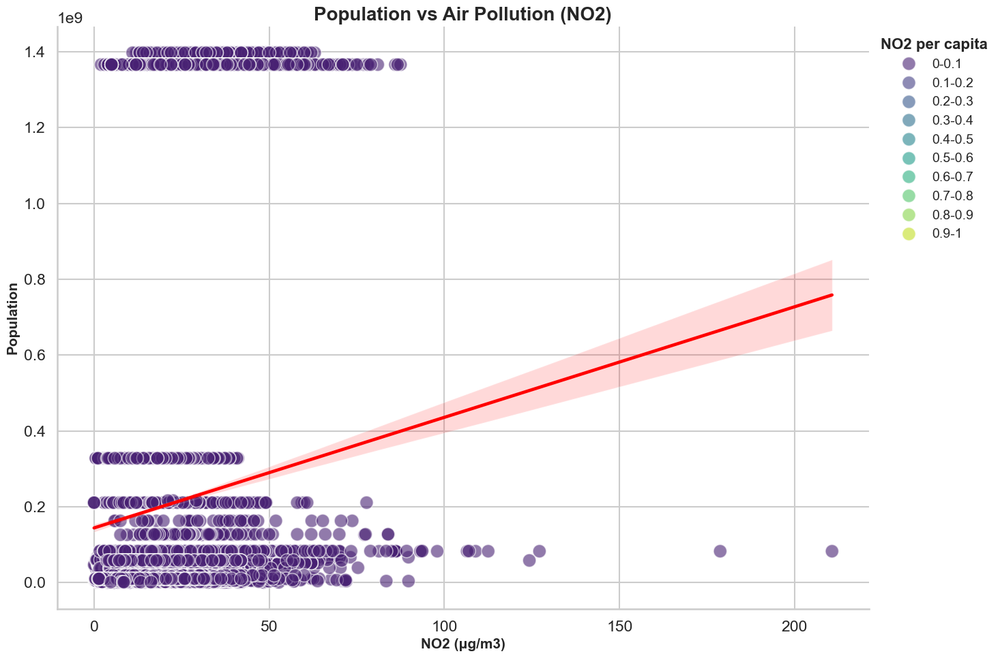

In [27]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# 3. aspect/pattern: Relationship between air pollution and population
# Scatter Plot (but better)
#-------------------------------------------------------------------------------------------------------------------------------------------------------


#  NO2 per person
combined_data['NO2_per_capita'] = combined_data['NO2 (μg/m3)'] / combined_data['pop_est']

intervals = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
labels = ['0-0.1', '0.1-0.2', '0.2-0.3', '0.3-0.4', '0.4-0.5', '0.5-0.6', '0.6-0.7', '0.7-0.8', '0.8-0.9', '0.9-1']

combined_data['NO2_interval'] = pd.cut(combined_data['NO2_per_capita'], bins=intervals, labels=labels)

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(15, 10))
scatterplot = sns.scatterplot(data=combined_data, x='NO2 (μg/m3)', y='pop_est', hue='NO2_interval', s=200, palette='viridis', alpha=0.6)

sns.regplot(data=combined_data, x='NO2 (μg/m3)', y='pop_est', scatter=False, color='r')

plt.title('Population vs Air Pollution (NO2)', fontsize=20, weight='bold')
plt.xlabel('NO2 (μg/m3)', fontsize=15, weight='bold')
plt.ylabel('Population', fontsize=15, weight='bold')
sns.despine()

legend = plt.legend(title='NO2 per capita', loc='upper left', bbox_to_anchor=(1, 1), fontsize=14, title_fontsize=16)
plt.setp(legend.get_title(), fontweight='bold')

title = plt.title('Population vs Air Pollution (NO2)', fontsize=20, weight='bold')
title.set_ha('center')
title.set_fontsize(20)
plt.gca().title.set_text("Population vs Air Pollution (NO2)")
plt.gca().title.set_fontsize(20)
plt.gca().title.set_weight('bold')

plt.tight_layout()
plt.show()


# 💡💡💡💡
# Improvements:
# Calculating NO2 levels per capita (NO2_per_capita) normalizes pollution data relative to population size.
# Benefit: This allows for a more detailed analysis and visualization of pollution levels, making it easier to identify and compare different ranges of NO2 exposure per capita.
# Regression Line: This highlights the overall trend and correlation between population size and NO2 levels, aiding in understanding the relationship.

---

Enough about air pollution?

For inspiration, consider these prompts for what you could focus on here: 
- Can you tell a "data story" with 3-4 visualizations, plus connecting text explanations?
- Can you combine two datasets to allow for interesting new perspectives?
- Can you create an educational infovis example yourself? E.g. by showing the same data in 3-4 different chart types and discussing their pros and cons for this specific dataset.

In [28]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------
# The "data story" of the connection between GDP and unemployment rate (in germany)
# - https://www.destatis.de/DE/Service/OpenData/_inhalt.html
#-------------------------------------------------------------------------------------------------------------------------------------------------------

# The GDP (Gross Domestic Product) is the total monetary value of all goods and servides produced within a country, 
# reflecting the economy's overall health.
# The unemployment rate measures the amount of labor force that is jobless and actively seeking word, 
# and it is tied to GDP as high unemplyment generally indicates lower economic output and reduced GDP growth, 
# while low unemployment suggests a more robust economy and higher GDP growth.

# This connection between GDP and unemployment rate can be evidently shown with the data:

In [29]:
data_folder = './data/' # adjust to your filesystem / setup, if you like

bip = pd.read_csv(data_folder+'bruttoinlandsprodukt_originalwert-2.csv', sep=';', header=None)
arbeitslose_zahlen = pd.read_csv(data_folder+'arbeitslose_deutschland_originalwert-2.csv', sep=';', header=None)

# Manually name the columns (adjustment based on the images)
bip.columns = ['Datum', 'GDP_in_Billion_EUR_Original', 'GDP_in_Billion_EUR_Adjusted', 'GDP_Chain_Index_Original', 'GDP_Chain_Index_Adjusted']
arbeitslose_zahlen.columns = ['Datum', 'Total_Unemployed_in_1000', 'Men_Unemployed_in_1000', 'Women_Unemployed_in_1000', 'Youth_Unemployed_Under_20_in_1000', 'Long_Term_Unemployed_in_1000']

# Convert date formats (accessing the column by name)
bip['Datum'] = pd.to_datetime(bip['Datum'], format='%d/%m/%Y', errors='coerce')
arbeitslose_zahlen['Datum'] = pd.to_datetime(arbeitslose_zahlen['Datum'], format='%d/%m/%Y', errors='coerce')

# Drop rows with invalid date values
bip = bip.dropna(subset=['Datum'])
arbeitslose_zahlen = arbeitslose_zahlen.dropna(subset=['Datum'])

# Convert European number formats (comma to dot and then to float)
for column in ['GDP_in_Billion_EUR_Original', 'GDP_in_Billion_EUR_Adjusted', 'GDP_Chain_Index_Original', 'GDP_Chain_Index_Adjusted']:
    bip[column] = bip[column].str.replace(',', '.').astype(float)

# Merge datasets on 'Datum'
merged_data = pd.merge(arbeitslose_zahlen, bip, on='Datum')

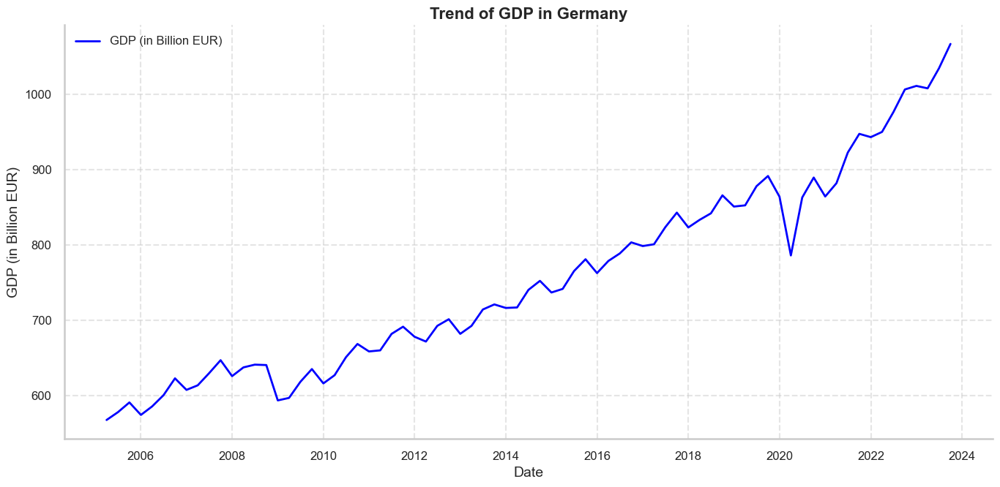

In [30]:
plt.figure(figsize=(14, 7))
sns.lineplot(x=merged_data['Datum'], y=merged_data['GDP_in_Billion_EUR_Original'], label='GDP (in Billion EUR)', color='blue', linewidth=2)
plt.title('Trend of GDP in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('GDP (in Billion EUR)', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# A line plot is chosen to effectively display the trend of GDP over time, with a continuous line that clearly represents changes over different dates.
# A grid is included with dashed lines and slight transparency to aid in following the data points across the plot, making it easier to interpret the trend.
# The legend is added so the viewer can determine in which size the GDP is measured.

# Insights:
# The line plot clearly illustrates the trend of GDP in Germany over time, allowing viewers to easily observe periods of economic growth or decline.
# By following the line, one can identify significant economic events or periods that correlate with changes in GDP, such as financial crises, policy changes, or economic booms.
# The GDP trend serves as a key indicator of Germany's economic health. Observing this trend provides insights into the country's economic trajectory and stability.
# (It also correlates to the unemployment rate as will be shown)

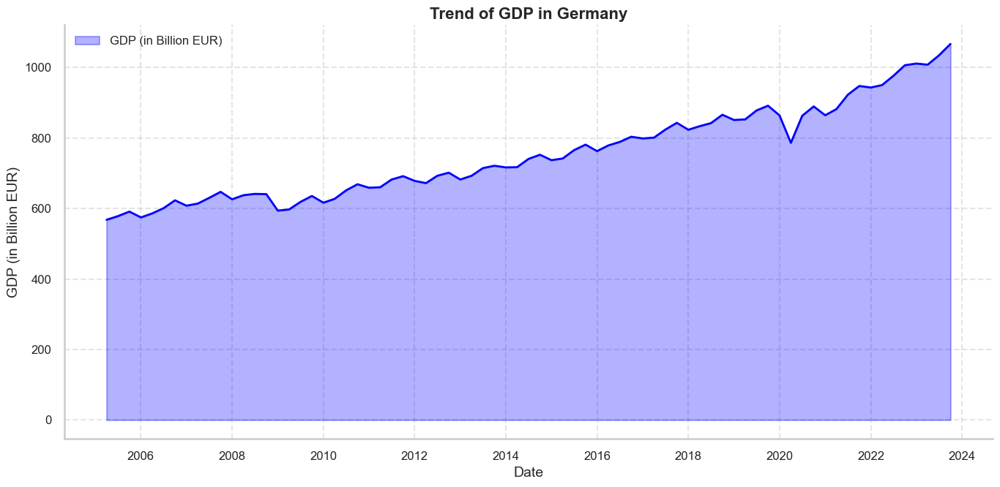

In [31]:
# To mark the value of GDP more as a "quantity" and a certain volume of money I use an area plot. 
plt.figure(figsize=(14, 7))
plt.fill_between(merged_data['Datum'], merged_data['GDP_in_Billion_EUR_Original'], color='blue', alpha=0.3, label='GDP (in Billion EUR)')
plt.plot(merged_data['Datum'], merged_data['GDP_in_Billion_EUR_Original'], color='blue', linewidth=2)

plt.title('Trend of GDP in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('GDP (in Billion EUR)', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# Improvements:
# The addition of the fill_between method fills the area under the GDP line, providing a visual representation of the magnitude of GDP over time.
# This adds visual emphasis to the trend
# The area fill uses a semi-transparent blue color (alpha=0.3), adding depth and a modern look to the plot.
# The transparency maintains the clarity of the plot while enhancing its visual appeal, making the data stand out more effectively.

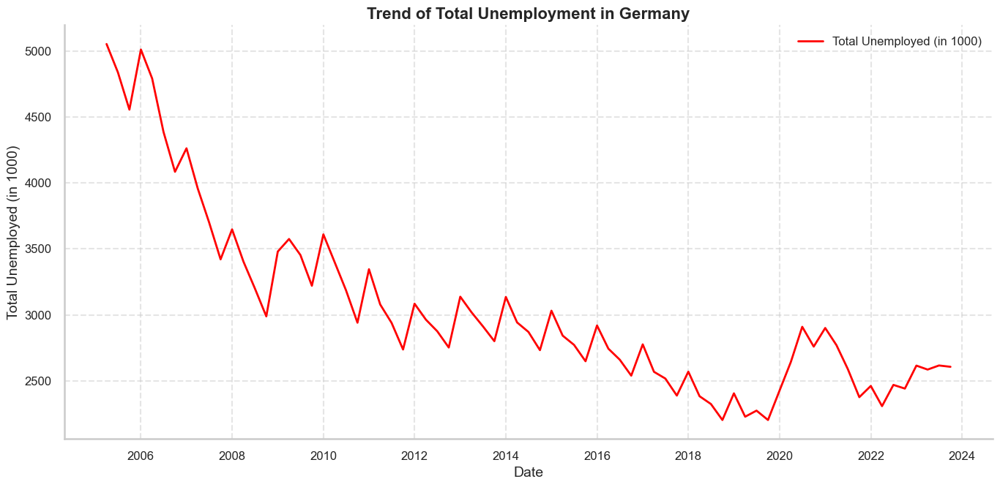

In [32]:
plt.figure(figsize=(14, 7))
sns.lineplot(x=merged_data['Datum'], y=merged_data['Total_Unemployed_in_1000'], label='Total Unemployed (in 1000)', color='red', linewidth=2)
plt.title('Trend of Total Unemployment in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Total Unemployed (in 1000)', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# A line plot is chosen to represent the trend of total unemployment over time.
# Line plots are ideal for displaying changes and trends over time, allowing for easy observation of patterns and fluctuations in the data.
# The grid aids in aligning the data points visually, making it easier to interpret the trend and values. The transparency prevents the grid from overwhelming the data.
# The legend is added to help understand how the unemployment is measured.

# Insights:
# The line plot effectively visualizes the trend of total unemployment in Germany over time, allowing viewers to observe periods of increase or decrease in unemployment levels.
# By examining the line, one can identify significant periods of change, such as economic downturns or recoveries, that correlate with changes in unemployment.
# The trend of total unemployment serves as a crucial indicator of the overall economic health of Germany. 
# Observing this trend provides insights into the labor market and economic stability.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/3867908038.py:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=merged_data['Datum'], y=merged_data['Total_Unemployed_in_1000'], color='red', ci=None)


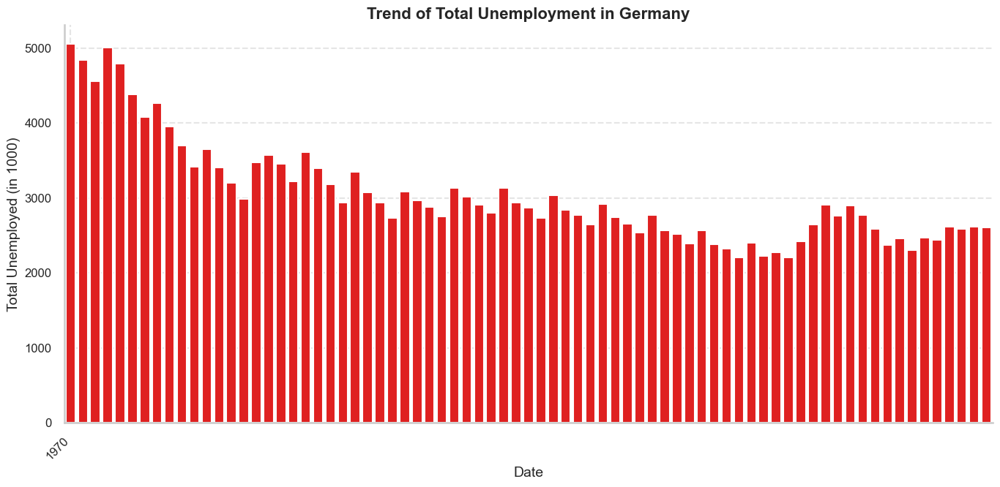

In [33]:
import matplotlib.dates as mdates  # Import mdates


# We can also enhance the visualization by using a bar plot. This also creates more volume.

# Bar plot for total unemployment trend
plt.figure(figsize=(14, 7))
sns.barplot(x=merged_data['Datum'], y=merged_data['Total_Unemployed_in_1000'], color='red', ci=None)

# Set title and labels
plt.title('Trend of Total Unemployment in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Total Unemployed (in 1000)', fontsize=14)

# Format the x-axis to show specific years
years = mdates.YearLocator(2)   # every 2 years
years_fmt = mdates.DateFormatter('%Y')
plt.gca().xaxis.set_major_locator(years)
plt.gca().xaxis.set_major_formatter(years_fmt)

plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)

# Add grid and remove spines
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# 💡💡💡💡
# Improvement:
# The bar plot represents the total number of unemployed individuals as bars, which makes it easier to see the volume of unemployment at each point in time.
# Bars can better convey the magnitude of unemployment numbers
# This visual "weight" of the bars makes the data more striking and memorable, helping viewers to quickly grasp the extent of unemployment.
# Also bars facilitate easier comparison between different time points.

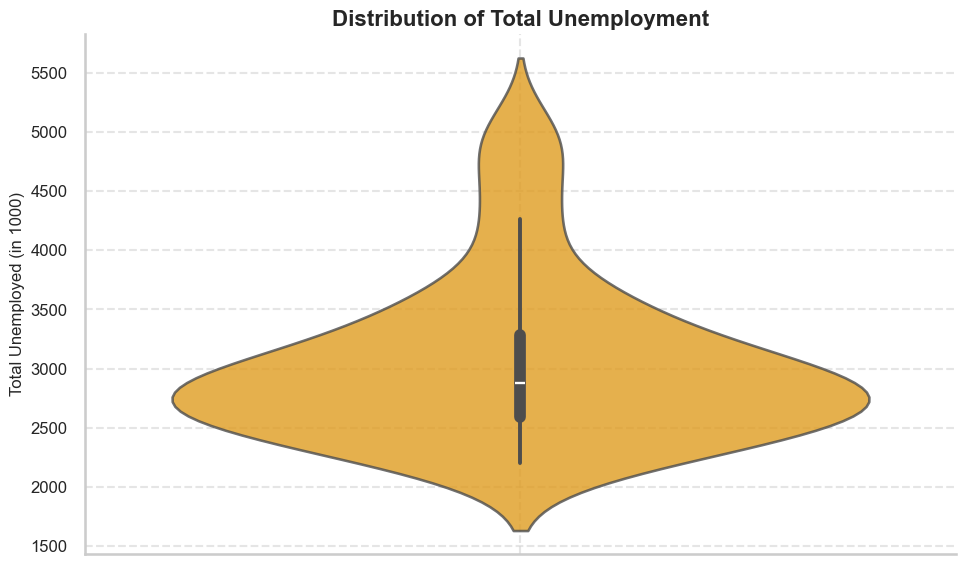

In [34]:
plt.figure(figsize=(10, 6))
sns.violinplot(y=merged_data['Total_Unemployed_in_1000'], color='#FFA500', alpha=0.8)  # Verwende eine orangefarbene Farbe mit einer Transparenz von 0.8
plt.title('Distribution of Total Unemployment', fontsize=16, fontweight='bold')  # Setze Titel mit erhöhter Schriftgröße und fettgedruckt
plt.xlabel('')  # Entferne die Beschriftung der x-Achse
plt.ylabel('Total Unemployed (in 1000)', fontsize=12)  # Setze Achsenbeschriftung mit spezifizierter Schriftgröße
plt.xticks(fontsize=12)  # Setze Schriftgröße für x-Achsenbeschriftungen
plt.yticks(fontsize=12)  # Setze Schriftgröße für y-Achsenbeschriftungen
plt.grid(True, linestyle='--', alpha=0.5)  # Füge gestrichelte Gitterlinien hinzu
sns.despine()  # Entferne den oberen und rechten Rahmen
plt.tight_layout()  # Verbessere das Layout, um Überlappungen zu vermeiden
plt.show()

# 💡💡💡💡
# Design:
# A violin plot is used to represent the distribution of total unemployment.
# Removing the top and right spines using sns.despine() gives the plot a cleaner look.
# This minimalist approach focuses attention on the data, making the plot appear more modern and less cluttered.

# Insights:
# Distribution Shape: The violin plot reveals the shape of the unemployment distribution, showing where the data is concentrated and how it spreads.
# This helps identify whether the distribution is symmetric, or not.
# Outliers: The violin plot can highlight outliers or unusual data points that may require further investigation. 
# These are areas where the distribution narrows or extends significantly.

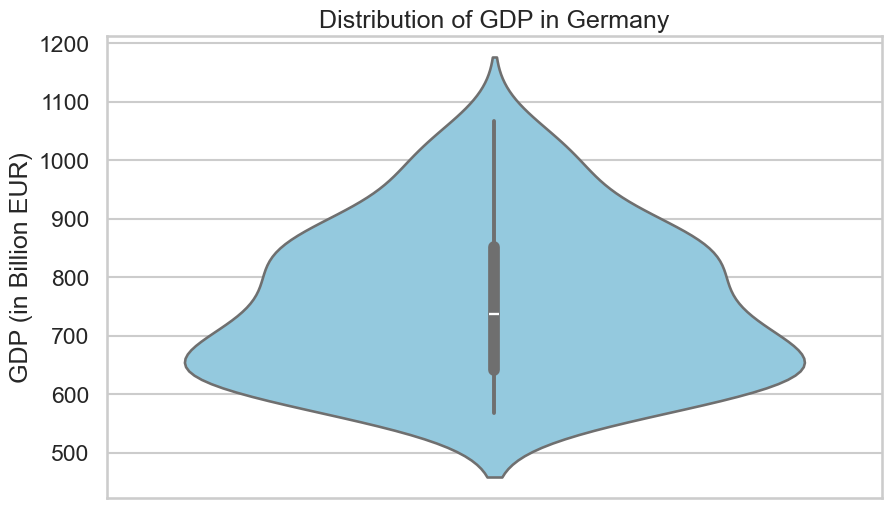

In [35]:
plt.figure(figsize=(10, 6))
sns.violinplot(y=merged_data['GDP_in_Billion_EUR_Original'], color='skyblue')
plt.title('Distribution of GDP in Germany')
plt.ylabel('GDP (in Billion EUR)')
plt.show()

# 💡💡💡💡
# Design:
# A violin plot is used to represent the distribution of GDP values.
# Since the plot focuses on the distribution of a single variable (GDP), 
# additional x-axis labeling is unnecessary. Simplifying the aesthetics keeps the viewer's attention on the distribution.

# Insights:
# The violin plot reveals the shape of the GDP distribution in Germany, indicating where the data is concentrated and how it spreads. 
# As in the plot before it can help identify if the distribution is symmetric.
# The violin plot can highlight outliers or unusual data points.

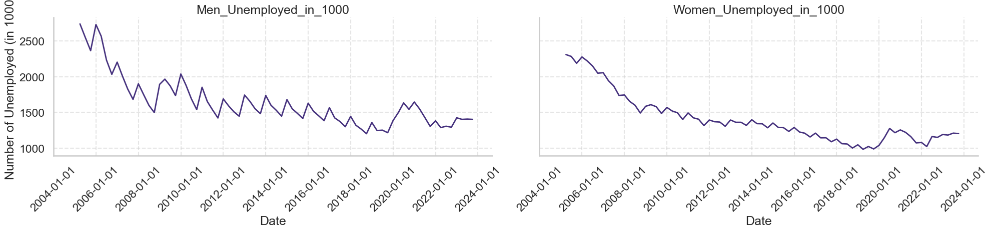

In [36]:
unemployment_melted = pd.melt(merged_data, 
                              id_vars=['Datum'], 
                              value_vars=['Men_Unemployed_in_1000', 'Women_Unemployed_in_1000'],
                              var_name='Gender', 
                              value_name='Unemployed_in_1000')

# Create a FacetGrid
g = sns.FacetGrid(unemployment_melted, col="Gender", height=5, aspect=2, sharey=True)
g.map(sns.lineplot, "Datum", "Unemployed_in_1000", linewidth=2)

# Add titles and labels
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Date", "Number of Unemployed (in 1000)")
g.set_xticklabels(rotation=45)
g.add_legend()

# Add grid lines
for ax in g.axes.flatten():
    ax.grid(True, linestyle='--', alpha=0.5)
    sns.despine()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# 💡💡💡💡
# Design:
# The data is reshaped using pd.melt() to transform the wide format into a long format. 
# This format is essential for creating a FacetGrid that separates the data by gender and allows for easy comparison.
# The FacetGrid approach enables clear and direct comparison between male and female unemployment trends, highlighting differences and similarities over time.
# Grid lines are added to each subplot with a dashed line style and transparency.

# Insights:
# The FacetGrid allows for direct comparison of unemployment trends between men and women, making it easy to see which gender has higher unemployment rates.
# It also shows the difference in the unemployment change over time.
# By examining the line plots, viewers can identify significant trends, such as periods of increasing or decreasing unemployment for each gender 
# and make out how they relate to each other.

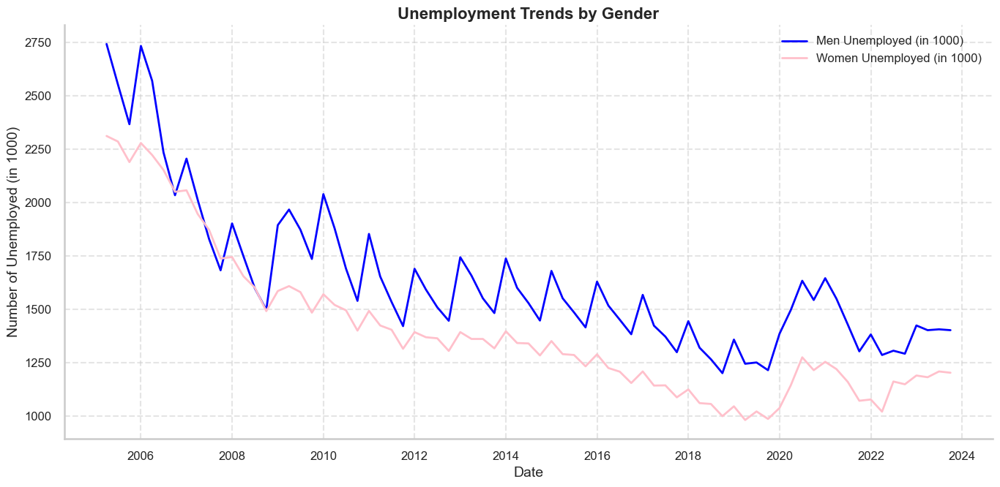

In [37]:
plt.figure(figsize=(14, 7))
sns.lineplot(x=merged_data['Datum'], y=merged_data['Men_Unemployed_in_1000'], label='Men Unemployed (in 1000)', color='blue', linewidth=2)
sns.lineplot(x=merged_data['Datum'], y=merged_data['Women_Unemployed_in_1000'], label='Women Unemployed (in 1000)', color='pink', linewidth=2)
plt.title('Unemployment Trends by Gender', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Unemployed (in 1000)', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Improvements:
# Direct Comparison: The combined line plot allows for direct comparison of male and female unemployment trends on the same axes.
# This makes it easier to see relative differences and interactions between the two.
# Plotting both trends on the same figure makes efficient use of the available space.

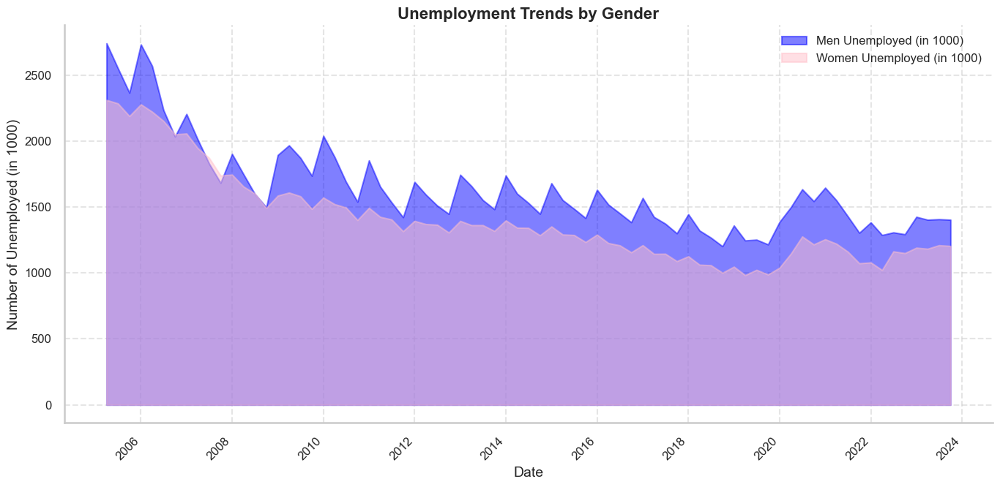

In [38]:
# Create area plot for unemployment by gender
plt.figure(figsize=(14, 7))
plt.fill_between(merged_data['Datum'], merged_data['Men_Unemployed_in_1000'], color='blue', alpha=0.5, label='Men Unemployed (in 1000)')
plt.fill_between(merged_data['Datum'], merged_data['Women_Unemployed_in_1000'], color='pink', alpha=0.5, label='Women Unemployed (in 1000)')

# Set title and labels
plt.title('Unemployment Trends by Gender', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Unemployed (in 1000)', fontsize=14)
plt.legend(fontsize=12)

# Improve x-axis ticks
years = mdates.YearLocator(2)   # every 2 years
years_fmt = mdates.DateFormatter('%Y')
plt.gca().xaxis.set_major_locator(years)
plt.gca().xaxis.set_major_formatter(years_fmt)

# Set the xticks and yticks font size and rotation
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)

# Add grid and remove spines
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# 💡💡💡💡
# Improvements:
# The filled areas give the visualizations more volume.
# The transparency allows for overlapping areas to be seen clearly, making the comparison between male and female unemployment.
# The filled areas make it easier to compare the overall trends and see how they stack up against each other.

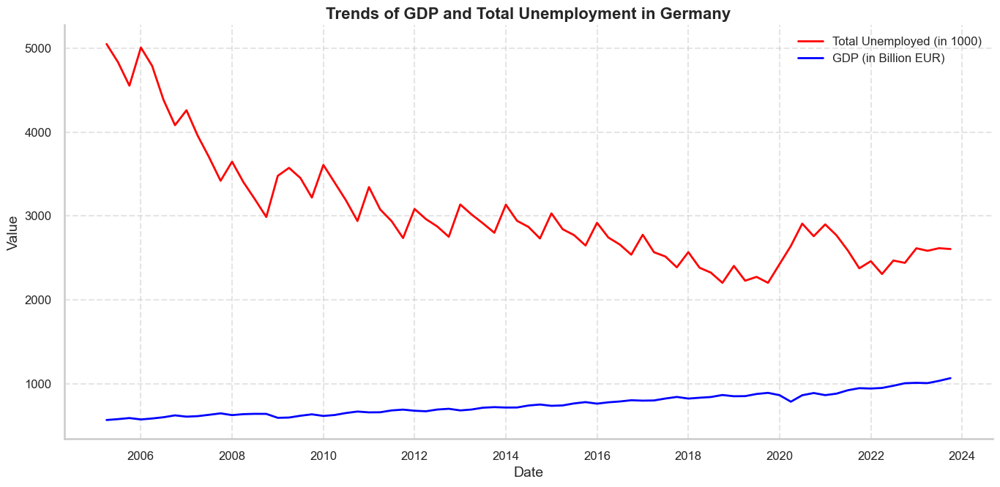

In [39]:
plt.figure(figsize=(14, 7))
sns.lineplot(x=merged_data['Datum'], y=merged_data['Total_Unemployed_in_1000'], label='Total Unemployed (in 1000)', color='red', linewidth=2)
sns.lineplot(x=merged_data['Datum'], y=merged_data['GDP_in_Billion_EUR_Original'], label='GDP (in Billion EUR)', color='blue', linewidth=2)
plt.title('Trends of GDP and Total Unemployment in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# Line plots are ideal for showing changes and trends over time, making it easy to observe patterns and fluctuations in both variables.
# The two color distinctions help differentiate the two datasets, making it easy for viewers to distinguish between them.

# Insights:
# The plot allows for the simultaneous observation of GDP and total unemployment trends over time, giving a view of economic performance.
# By plotting both GDP and unemployment on the same graph, viewers can observe potential correlations between the two.
# Further specific periods where trends diverge or converge can be identified.

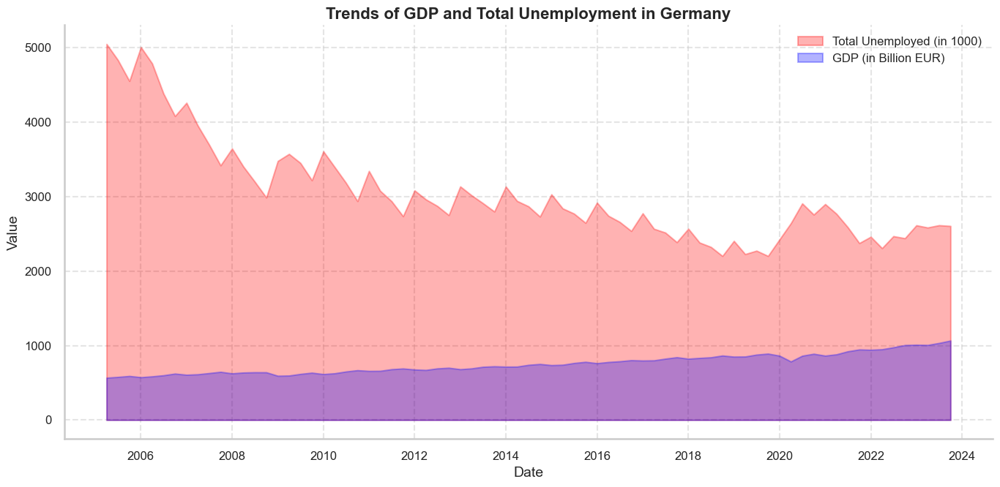

In [40]:
plt.figure(figsize=(14, 7))
plt.fill_between(merged_data['Datum'], merged_data['Total_Unemployed_in_1000'], color='red', alpha=0.3, label='Total Unemployed (in 1000)')
plt.fill_between(merged_data['Datum'], merged_data['GDP_in_Billion_EUR_Original'], color='blue', alpha=0.3, label='GDP (in Billion EUR)')
plt.title('Trends of GDP and Total Unemployment in Germany', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Improvements:
# The filled areas emphasize the magnitude of the variables more effectively than lines alone.
# This helps to show the scale of GDP and unemployment.
# Different colors with semi-transparency help to clearly differentiate between the two datasets.

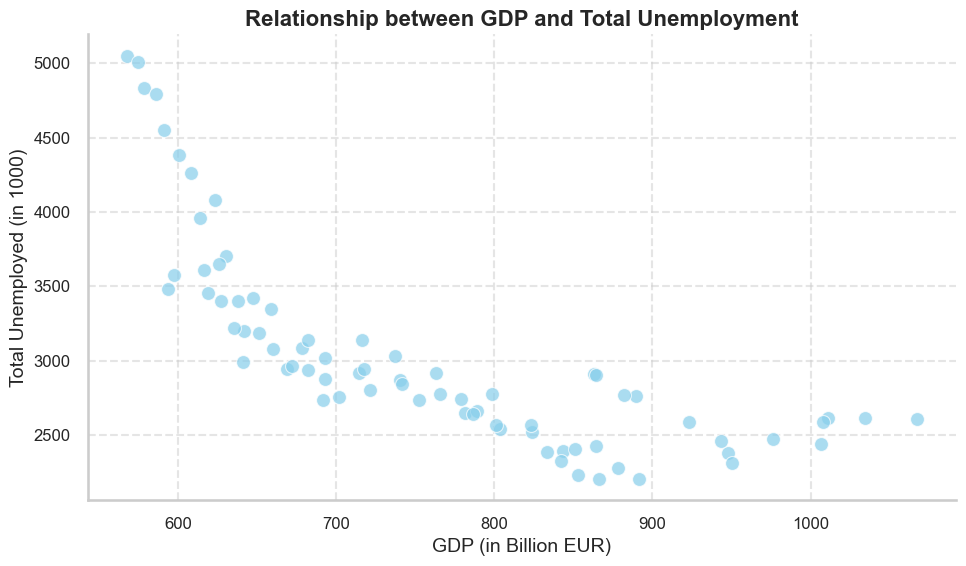

In [41]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=merged_data['GDP_in_Billion_EUR_Original'], y=merged_data['Total_Unemployed_in_1000'], color='skyblue', s=100, alpha=0.7)
plt.title('Relationship between GDP and Total Unemployment', fontsize=16, fontweight='bold')
plt.xlabel('GDP (in Billion EUR)', fontsize=14)
plt.ylabel('Total Unemployed (in 1000)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
sns.despine()
plt.tight_layout()
plt.show()

# 💡💡💡💡
# Design:
# The scatter plot makes it easier to represent the relationship between GDP and unemployment at one certain point.
# The chosen color is visually appealing and distinct, while the transparency ensures that overlapping points remain visible, enhancing the plot's readability.
# Larger points are easier to see and differentiate, especially when there are many data points. 
# Although the can't be too large so show one specific value while they are at the same time easily to spot.

# Insights:
# By plotting all data points, outliers become easily identifiable.
# The scatter plot shows if there is a correlation between GDP and total unemployment.

<Figure size 1000x600 with 0 Axes>

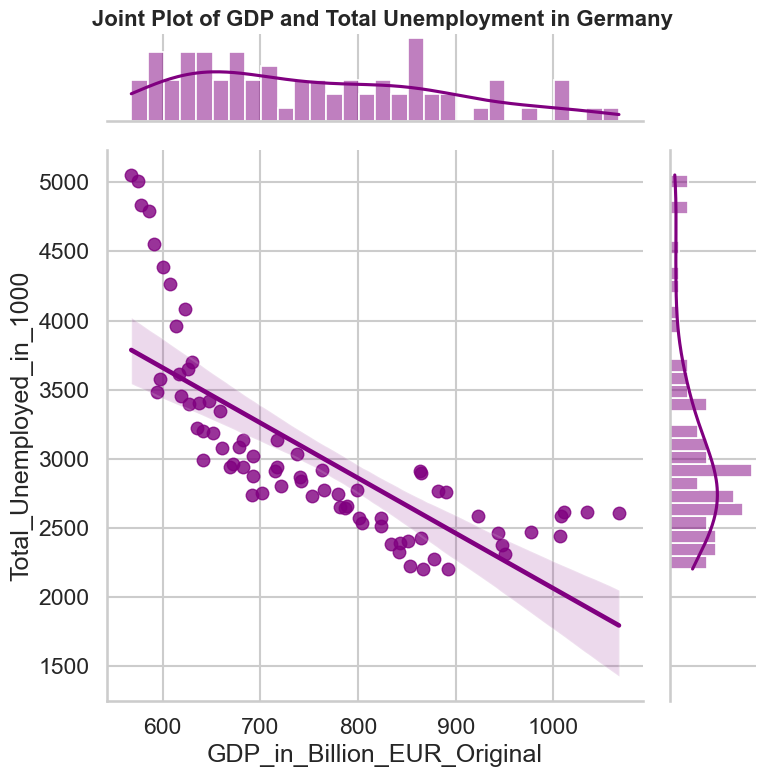

In [42]:
plt.figure(figsize=(10, 6))
sns.jointplot(
    x='GDP_in_Billion_EUR_Original',
    y='Total_Unemployed_in_1000',
    data=merged_data,
    kind='reg',  # Kind can be 'scatter', 'reg', 'resid', 'kde', or 'hex'
    color='purple',
    height=8,
    marginal_kws=dict(bins=30, fill=True)
)
plt.suptitle('Joint Plot of GDP and Total Unemployment in Germany', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# 💡💡💡💡
# Design:
# The joint plot combines a scatter plot with a regression line and marginal histograms, giving a multifaceted view of the data. 
# This approach allows for the exploration of relationships between GDP and total unemployment while also showing additional information.
# Marginal histograms are included with 30 bins and filled bars.
# These histograms help to understand the spread and concentration of each variable.

# Insights:
# Correlation: The regression line in the joint plot indicates the nature of the relationship between GDP and unemployment.
# The scatter plot helps in identifying outliers that are seperate from the regression line.

# Part 2: Exploring multdimensional and hierarchical data with interaction 🔍

In [43]:
import plotly.express as px 
# also needs: conda install -c conda-forge nbformat 
# or pip equivalent, see here: https://stackoverflow.com/questions/66557543/valueerror-mime-type-rendering-requires-nbformat-4-2-0-but-it-is-not-installed

Plotly (express) provides basic chart types for multidimensional data with interaction "out of the box". 
Here is an example from the [documentation](https://plotly.com/python/parallel-coordinates-plot/). Try out brushing with the mouse along the different axes!

In [44]:
import plotly.express as px
import plotly.io as pio
import pandas as pd

# Load the dataset
df = px.data.iris()

# Ensure Plotly is up-to-date
print(px.__version__)

# Create the parallel coordinates plot
fig = px.parallel_coordinates(df, color="species_id",
                              labels={"species_id": "Species",
                                      "sepal_width": "Sepal Width", "sepal_length": "Sepal Length",
                                      "petal_width": "Petal Width", "petal_length": "Petal Length"},
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)

# Show the figure
fig.show()


AttributeError: module 'plotly.express' has no attribute '__version__'

In [ ]:
df = px.data.iris()
fig = px.parallel_coordinates(df, color="species_id", labels={"species_id": "Species",
                "sepal_width": "Sepal Width", "sepal_length": "Sepal Length",
                "petal_width": "Petal Width", "petal_length": "Petal Length", },
                             color_continuous_scale=px.colors.diverging.Tealrose,
                             color_continuous_midpoint=2)
fig.show()

Choose a **multidimensional** dataset and explore it by creating interactive visualizations with Plotly. See the Plotly overview of chart types [here](https://plotly.com/python/plotly-express/). 

In [45]:
# Dataset about cigarette consumption: 
# (The reflections about interactions used and impact on Exploration mitght overlap sometimes)


import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# load data
file_path_smoking = '/Users/valentino/Documents/Uni/3. Semester/InfoVis/portfolio_bundle/data/smoking.csv'  # Aktualisiere diesen Pfad entsprechend
df_smoking = pd.read_csv(file_path_smoking)

df_smoking.columns = [
    'Country',
    'Year',
    'DailyCigarettes',
    'PercentageMale',
    'PercentageFemale',
    'PercentageTotal',
    'SmokersTotal',
    'SmokersFemale',
    'SmokersMale'
]

In [46]:
# Interaktive Scatter Plot Matrix (SPLoM) zur Erkundung der multidimensionalen Daten
fig_splom = px.scatter_matrix(df_smoking,
                              dimensions=['DailyCigarettes', 'PercentageMale', 'PercentageFemale', 'PercentageTotal'],
                              color='Country',
                              title='Scatter Plot Matrix of Smoking Data')

# Anzeigen der Scatter Plot Matrix
fig_splom.show()

# 💡💡💡💡
# Design: 
# Selection of Dimensions: The dimensions 'DailyCigarettes', 'PercentageMale', 'PercentageFemale', and 'PercentageTotal' 
# provide a comprehensive overview of smoking habits, considering both daily consumption and gender distribution.
# Color: The color scheme is based on the country ('Country'). This makes it easier to identify patterns and differences between countries.
# Interactivity: The interactive nature of the plot allows users to zoom in on specific data points and filter the data.

# Insights:
# Correlations: Users can identify potential correlations between the different dimensions, 
# such as whether countries with a high percentage of male smokers also have a high percentage of female smokers.
# Distribution Patterns: The scatter plot matrix allows for the visualization of distribution patterns within and between dimensions.

In [47]:
# Interaktive Treemap zur Darstellung hierarchischer Daten
fig_treemap = px.treemap(df_smoking,
                         path=['Country', 'Year'],
                         values='SmokersTotal',
                         color='PercentageTotal',
                         hover_data=['DailyCigarettes', 'PercentageMale', 'PercentageFemale'],
                         title='Treemap of Smoking Data by Country and Year')

# Anzeigen der Treemap
fig_treemap.show()

# 💡💡💡💡
# Design:
# Hierarchical Path: The hierarchical path includes 'Country' and 'Year', allowing users to explore the data at different levels of detail.
# Value Representation: The size of each rectangle is determined by 'SmokersTotal', giving a visual representation of the total number of smokers in each category.
# Color Coding: The color represents 'PercentageTotal', giving an additional layer of information about the proportion of smokers in the population.
# Hover Data: Additional information is displayed on hover.

# Insights:
# Country and Year Trends: Users can see how smoking trends differ between countries and how they have changed over the years. This can help identify specific periods.
# Comparative Analysis: The color and size encoding enable a quick comparative analysis between different countries and years. So it's easier to spot outliers.
# Detailed Exploration: The hover functionality provides a deeper layer of data without overwhelming the viewer at first sight.

In [48]:
# Erstelle ein Parallel Coordinates Plot zur Erkundung der multidimensionalen Daten
fig_parallel = px.parallel_coordinates(df_smoking,
                                       dimensions=['DailyCigarettes', 'PercentageMale', 'PercentageFemale', 'PercentageTotal', 'SmokersTotal'],
                                       color='PercentageTotal',
                                       color_continuous_scale=px.colors.diverging.Tealrose,
                                       title='Parallel Coordinates Plot of Smoking Data')

# Anzeigen des Parallel Coordinates Plot
fig_parallel.show()

# 💡💡💡💡
# Design:
# Selection of Dimensions: The dimensions ‘DailyCigarettes’, ‘PercentageMale’, ‘PercentageFemale’, ‘PercentageTotal’, and ‘SmokersTotal’ 
# were selected to capture various aspects of smoking habits.
# Color Coding: The ‘PercentageTotal’ is used for color coding with a diverging Tealrose color scale. This choice shows variations in the total percentage of smokers.

# Insights:
# Correlations and Patterns: The parallel coordinates plot allows users to identify correlations and patterns between the different dimensions.
# Distribution Analysis: The color gradient helps in analyzing the distribution of smoking percentages across the different dimensions, making it easier to identify outliers.

In [49]:
heatmap_data = df_smoking.groupby(['Country', 'Year']).mean().reset_index()

# Pivot the data for the heatmap
pivot_data = heatmap_data.pivot(index='Country', columns='Year', values='PercentageTotal')

# Erstelle die Heatmap
fig_heatmap = px.imshow(
    pivot_data,
    aspect="auto",
    color_continuous_scale='Viridis',
    title='Heatmap of Average Smoking Percentage by Country and Year',
    labels={'color': 'Percentage Total'},
    width=1000,
    height=800
)

# Customize the layout for better readability, including angled year labels
fig_heatmap.update_layout(
    xaxis_title='Year',
    yaxis_title='Country',
    title_x=0.5,
    title_y=0.95,
    margin=dict(l=200, r=20, t=100, b=20),
    xaxis=dict(tickmode='linear', tickangle=-45)
)

# Anzeigen der Heatmap
fig_heatmap.show()

# 💡💡💡💡
# Design:
# Data: The data was pivoted to create a matrix with countries as rows and years as columns, allowing for a clear comparison of smoking percentages over time for each country.
# Color Scale: The ‘Viridis’ color scale was chosen to make it easier to distinguish between different levels of smoking percentages.
# Layout Customization: The layout was customized for better readability, including angled year labels to avoid overlap and ensure that all labels are visible.

# Insight:
# Temporal Trends: Users can observe trends over time for each country, identifying periods of increase or decrease in smoking percentages.
# Country Comparisons: The heatmap allows for easy comparison between countries.

In [50]:
# Erstelle einen 3D-Scatterplot zur Erkundung der multidimensionalen Daten
fig_3d_scatter = px.scatter_3d(df_smoking,
                               x='DailyCigarettes',
                               y='PercentageMale',
                               z='PercentageFemale',
                               color='Country',
                               size='PercentageTotal',
                               title='3D Scatter Plot of Smoking Data',
                               labels={
                                   'DailyCigarettes': 'Daily Cigarettes',
                                   'PercentageMale': 'Percentage Male',
                                   'PercentageFemale': 'Percentage Female'
                               })

# Hinzufügen von Interaktivität: Zoomen und Rotieren
fig_3d_scatter.update_layout(
    scene=dict(
        xaxis=dict(title='Daily Cigarettes'),
        yaxis=dict(title='Percentage Male'),
        zaxis=dict(title='Percentage Female')
    ),
    margin=dict(l=0, r=300, b=0, t=40),  # Größere rechte Marge, um Platz für die Legende zu schaffen
    legend=dict(
        x=1.05,  # Positioniere die Legende etwas weiter rechts
        y=1,  # Positioniere die Legende oben
        traceorder='normal',
        font=dict(size=10),
        itemsizing='constant'  # Konstante Größe für Legendenobjekte
    )
)

# Anzeigen des 3D-Scatterplots
fig_3d_scatter.show()

# 💡💡💡💡
# Design:
# Color : Different countries are represented by distinct colors, aiding in the visual separation of data points by country.
# The size of the data points corresponds to ‘PercentageTotal’, indicating the overall smoking rate for each country
# Interactivity: The plot supports zooming and rotating, allowing users to explore the data from multiple perspectives, 
# which helps in identifying patterns and relationships which may not be possible in static views.

# Insights:
# Country-Specific Patterns: The color coding shows the comparisons between countries, makint it able to identify countries with similar smoking habits.
# Proportions: The size of the data points show countries with higher or lower smoking percantage.
#  Dta Exploration: The interactive features such as zooming and rotating enhance the ability to uncover hidden relationships.

💡💡💡💡 
Summary of explorations and interactions:
The use of interactive visualizations enhanced the exploration of smoking data by enabling a dynamic and detailed analysis with multiple dimensions. Interactive scatter plot matrices show correlations and patterns and treemaps allow for hierarchical temporal analysis. Parallel coordinates plots highlight complex relationships, and heatmaps show temporal trends and country comparisons. The 3D scatter plot provided a multidimensional perspective on gender-specific smoking rates and daily consumption. These interactive features allow an improved exploration, uncovering hidden patterns and providing a deeper understanding of the data.

---

 A **hierarchical** dataset and explored with Plotly, using a [treemap](https://plotly.com/python/treemaps/) or a [sunburst chart](https://plotly.com/python/sunburst-charts/) or a [tree plot](https://plotly.com/python/tree-plots/).a


In [51]:
# Dataset about Amazon Prime Userbase Data: 
# https://www.kaggle.com/datasets/arnavsmayan/amazon-prime-userbase-dataset?resource=download
# (The reflections about interactions used and impact on Exploration mitght overlap sometimes)

import pandas as pd
import plotly.express as px

# Daten laden
prime_path = '/Users/valentino/Documents/Uni/3. Semester/InfoVis/portfolio_bundle/data/amazon_prime_users.csv'
prime_data = pd.read_csv(prime_path)

# Daten in hierarchische Struktur umwandeln
hierarchical_data = prime_data.groupby(['Subscription Plan', 'Payment Information']).apply(lambda x: x.to_dict(orient='records')).reset_index()
hierarchical_data.columns = ['Subscription Plan', 'Payment Information', 'User Details']


/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/633749713.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [52]:
flat_data = hierarchical_data.explode('User Details').reset_index(drop=True)
flat_user_details = pd.json_normalize(flat_data['User Details'])
flat_combined = flat_data.drop(columns=['User Details']).join(flat_user_details, rsuffix='_user')

fig_treemap = px.treemap(flat_combined, 
                         path=['Subscription Plan', 'Payment Information', 'Name'], 
                         values='User ID',
                         title='Treemap of Subscription Plans, Payment Information, and Users')

fig_treemap.show()

# 💡💡💡💡
# Design:
# Hierarchical Path: The hierarchical path includes ‘Subscription Plan’, ‘Payment Information’, and ‘Name’, showing the data at different levels of depth.
# Value Representation: The size of each rectangle is determined by ‘User ID’, which provides a visual representation of the number of users in each category.

# Insights:
# Subscription Plan Distribution: Users can see how users are distributed across different subscription plans, showing the most and least used plans.
# Payment Method Analysis: The breakdown of payment information within each subscription plan helps understand which payment methods are preferred by users of a certain plans.
# User Details: The detailed level of ‘Name’ allows for specific user information for a deeper analysis.

In [53]:
hierarchical_data = prime_data.groupby(['Subscription Plan', 'Payment Information']).apply(lambda x: x.to_dict(orient='records')).reset_index()
hierarchical_data.columns = ['Subscription Plan', 'Payment Information', 'User Details']

# Explodiere die User Details, um eine flache Struktur zu erhalten
flat_data = hierarchical_data.explode('User Details').reset_index(drop=True)
flat_user_details = pd.json_normalize(flat_data['User Details'])
flat_combined = flat_data.drop(columns=['User Details']).join(flat_user_details, rsuffix='_user')

# Sicherstellen, dass alle Spalten korrekt übernommen wurden

# Circle Packing Diagram (Sunburst Plot) erstellen
fig_circle_packing = px.sunburst(flat_combined, 
                                 path=['Subscription Plan', 'Payment Information', 'Name'], 
                                 values='User ID',
                                 title='Circle Packing Diagram of Subscription Plans, Payment Information, and Users')

# Anpassung des Circle Packing Diagramms
fig_circle_packing.update_traces(marker=dict(line=dict(width=0.5, color='black')))

# Sicherstellen, dass Zoom aktiviert ist
fig_circle_packing.update_layout(
    hovermode='closest',
    margin=dict(t=50, l=25, r=25, b=25)
)

# Plot anzeigen
fig_circle_packing.show()

# 💡💡💡💡
# Design:
# Hierarchical Path: The hierarchical path includes ‘Subscription Plan’, ‘Payment Information’, and ‘Name’, 
# giving a detailed exploration of how many users choose different subscription plans.
# Value Representation: The size of each segment is determined by ‘User ID’, visually representing the number of users in each category.

# Insights:
# Subscription Plan Distribution: The sunburst plot reveals how users are distributed across various subscription plans, highlighting the most and least popular plans.
# User Details: At the most detailed level, specific user names provide insights into individual user data, which can be useful for a more detailed analysis

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/611750003.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [54]:
fig_icicle = px.icicle(flat_combined, 
                       path=['Subscription Plan', 'Payment Information', 'Name'], 
                       values='User ID',
                       title='Icicle Plot of Subscription Plans, Payment Information, and Users')

fig_icicle.show()

# 💡💡💡💡
# Design:
# Hierarchical Path: The hierarchical path includes ‘Subscription Plan’, ‘Payment Information’, and ‘Name’, 
# allowing for an exploration of user distribution across different subscription plans.
# Value Representation: The size of each segment is determined by ‘User ID’, visually representing the number of users in each category. 
# This approach helps quickly identify the largest user groups.

# Insights:
# Subscription Plan Distribution: The icicle plot reveals how users are distributed across various subscription plans, pronouncing which plans are more or less popular.
# Payment Method Preferences: Within each subscription plan, the distribution of payment methods helps to understand user preferences.

In [55]:
hierarchical_data = prime_data.groupby(['Subscription Plan', 'Payment Information']).apply(lambda x: x.to_dict(orient='records')).reset_index()
hierarchical_data.columns = ['Subscription Plan', 'Payment Information', 'User Details']

# Explodiere die User Details, um eine flache Struktur zu erhalten
flat_data = hierarchical_data.explode('User Details').reset_index(drop=True)
flat_user_details = pd.json_normalize(flat_data['User Details'])
flat_combined = flat_data.drop(columns=['User Details']).join(flat_user_details, rsuffix='_user')

# Daten für das Sankey-Diagramm vorbereiten
subscription_plans = flat_combined['Subscription Plan'].unique()
payment_info = flat_combined['Payment Information'].unique()
names = flat_combined['Name'].unique()

labels = list(subscription_plans) + list(payment_info) + list(names)
source = []
target = []
value = []

# Indizes für die Labels
subscription_plan_idx = {plan: idx for idx, plan in enumerate(subscription_plans)}
payment_info_idx = {info: idx + len(subscription_plan_idx) for idx, info in enumerate(payment_info)}
name_idx = {name: idx + len(subscription_plan_idx) + len(payment_info_idx) for idx, name in enumerate(names)}

# Verbindungen für das Sankey-Diagramm erstellen
for _, row in flat_combined.iterrows():
    # Verbindung von Subscription Plan zu Payment Information
    source.append(subscription_plan_idx[row['Subscription Plan']])
    target.append(payment_info_idx[row['Payment Information']])
    value.append(1)

    # Verbindung von Payment Information zu Name
    source.append(payment_info_idx[row['Payment Information']])
    target.append(name_idx[row['Name']])
    value.append(1)

# Sankey-Diagramm erstellen
fig_sankey = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=[label if idx < len(subscription_plan_idx) + len(payment_info_idx) else '' for idx, label in enumerate(labels)],
        customdata=labels,
        hovertemplate='%{customdata}<extra></extra>'
    ),
    link=dict(
        source=source,
        target=target,
        value=value
    )
)])

fig_sankey.update_layout(title_text="Sankey Diagram of Subscription Plans, Payment Information, and Users", font_size=10)
fig_sankey.show()

# 💡💡💡💡
# Design:
# Hierarchical Path: The Sankey diagram represents the flow from ‘Subscription Plan’ to ‘Payment Information’ to ‘Name’.
# Labels and Indices: Unique labels for each ‘Subscription Plan’, ‘Payment Information’, and ‘Name’ were created. 
# Indices were assigned to make connections between the different nodes.

# Insights:
# Flow Visualization: The Sankey diagram effectively shows the flow of users from subscription plans to payment information methods and then to individual users. 
# This helps identify the most popular paths.
# User Distribution: The connections and their thicknesses provide insights into how many users follow specific paths, highlighting the most common ones.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/1339521108.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [56]:
hierarchical_data = prime_data.groupby(['Subscription Plan', 'Payment Information']).apply(lambda x: x.to_dict(orient='records')).reset_index()
hierarchical_data.columns = ['Subscription Plan', 'Payment Information', 'User Details']

flat_data = hierarchical_data.explode('User Details').reset_index(drop=True)
flat_user_details = pd.json_normalize(flat_data['User Details'])
flat_combined = flat_data.drop(columns=['User Details']).join(flat_user_details, rsuffix='_user')


user_counts = flat_combined.groupby(['Subscription Plan', 'Payment Information']).size().reset_index(name='User Count')

fig_bar = px.bar(user_counts, 
                 x='Subscription Plan', 
                 y='User Count', 
                 color='Payment Information', 
                 barmode='group', 
                 title='Bar Chart of Subscription Plans and Payment Information',
                 labels={'User Count':'Number of Users'})

fig_bar.show()

# 💡💡💡💡
# Design:
# Categorical Grouping: The bar chart groups data by ‘Subscription Plan’ and colors by ‘Payment Information’. 
# This setup allows for a clear comparison of the number of users for different subscriptions.
# User Count Representation: The y-axis represents the ‘User Count’, which indicates the number of users in each category. 
# This helps in quickly identifying the popularity of different subscriptions.
# Bar Mode: The ‘group’ bar mode was chosen to place bars side by side, enhancing comparability within each subscription plan.

# Insights:
# Subscription Plan Popularity: The chart reveals the number of users subscribed to each plan, highlighting which plans are more or less popular.
# Payment Method Preferences: Within each subscription plan, the chart shows the preferred payment methods.
# Comparative Analysis: The grouped bars allow for direct comparison of user counts across different payment methods within the same subscription plan.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/833896710.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [57]:
hierarchical_data = prime_data.groupby(['Subscription Plan', 'Payment Information']).apply(lambda x: x.to_dict(orient='records')).reset_index()
hierarchical_data.columns = ['Subscription Plan', 'Payment Information', 'User Details']

# Explodiere die User Details, um eine flache Struktur zu erhalten
flat_data = hierarchical_data.explode('User Details').reset_index(drop=True)
flat_user_details = pd.json_normalize(flat_data['User Details'])
flat_combined = flat_data.drop(columns=['User Details']).join(flat_user_details, rsuffix='_user')

# Sicherstellen, dass alle Spalten korrekt übernommen wurden

# Anzahl der Benutzer in den verschiedenen Kategorien zählen
user_counts = flat_combined.groupby(['Subscription Plan', 'Payment Information']).size().reset_index(name='User Count')

# Heatmap erstellen
fig_heatmap = px.density_heatmap(user_counts, 
                                 x='Subscription Plan', 
                                 y='Payment Information', 
                                 z='User Count', 
                                 color_continuous_scale='Viridis',
                                 title='Heatmap of Subscription Plans and Payment Information',
                                 labels={'User Count':'Number of Users'})

fig_heatmap.show()

# 💡💡💡💡
# Design:
# Categorical Axes: The heatmap uses ‘Subscription Plan’ as the x-axis and ‘Payment Information’ as the y-axis. 
# This setup allows for the visualization of user distribution across different combinations of subscription plans and payments.
# Value Representation: The ‘User Count’ is represented by the color intensity, with a continuous color scale (‘Viridis’) providing a clear visual cue for the user count.

# Insights:
# User Distribution: The heatmap reveals the distribution of users across different subscription plans and payment methods, highlighting popular combinations.
# Hotspots Identification: Areas with higher color intensity indicate popular subscription plan and payment method combinations.
# Comparative Analysis: The visual representation allows for easy comparison between different categories, helping to identify trends.

/var/folders/nh/w8n5mw3j01gc2yvzqnjx18z00000gn/T/ipykernel_9066/1693993757.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



💡💡💡💡
Summary of explorations and interactions:
Throughout the exploration different interactive visualizations, like bar charts, heatmaps, etc. helped to uncover different aspects of the data. These interactions enabled a detailed analysis, allowing for a better understanding of user distribution and preferences. By visualizing hierarchical relationships and categorical distributions, these tools highlight trends, and outliers, significantly enhancing the ability to make data based decisions.

# Own project 🏆

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px

In [59]:
cancer = pd.read_csv('/Users/valentino/Documents/Uni/3. Semester/InfoVis/portfolio_bundle/data/The_Cancer_data_1500_V2.csv')

In [60]:
# Set the style
sns.set(style="whitegrid")

In [61]:
import pandas as pd
import plotly.graph_objects as go

# Calculate the number of cancer cases for each age
age_cancer_cases = cancer[cancer['Diagnosis'] == 1].groupby('Age')['Diagnosis'].count().reset_index()
age_cancer_cases.columns = ['Age', 'CancerCases']

# Create a figure
fig = go.Figure()

# Add the cancer cases line with points
fig.add_trace(go.Scatter(
    x=age_cancer_cases['Age'],
    y=age_cancer_cases['CancerCases'],
    mode='lines+markers',
    name='Cancer Cases',
    line=dict(color='red'),
    marker=dict(color='red')
))

# Update the layout
fig.update_layout(
    title=dict(
        text='Cancer Cases Over Age',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Age',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Cancer Cases',
            font=dict(size=16)
        ),
        tickfont=dict(size=14),
        showgrid=True,
        gridwidth=1
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(size=14)
    )
)

# Show the plot
fig.show()

# 💡💡💡💡
# Design:
# Line and Marker Plot:
# Choice: The plot uses both lines and markers to represent the number of cancer cases over different ages.
# Reason: Combining lines with markers helps to clearly display the trend over age while also highlighting the individual data points for better visibility and accuracy.
# Color Scheme:
# Choice: The line and markers are colored red.
# Reason: Red is a attention-grabbing color suitable for highlighting the seriousness of cancer cases.

# Insights:
# Age Distribution of Cancer Cases:
# By examining the trend line, viewers can identify which age groups have higher occurrences of cancer cases. 
# Peaks in the graph indicate ages where cancer cases are most frequent.
# Trend Analysis:
# Insight: The line plot allows viewers to observe the general trend of cancer cases as age increases. 
# It reveals whether cancer cases increase, decrease, or remain constant with age.
# Data Points:
# Insight: The markers make it possible to see the specific number of cases for each age, giving a detailed view of the data.

In [62]:
import pandas as pd
import plotly.express as px

# Create a histogram for age distribution
fig_age = px.histogram(
    cancer,
    x='Age',
    color='Diagnosis',
    title='Age Distribution by Cancer Diagnosis',
    labels={'Age': 'Age', 'Diagnosis': 'Cancer Diagnosis (0: No, 1: Yes)'},
    barmode='overlay',
    color_discrete_map={0: 'blue', 1: 'red'}
)

# Update the layout
fig_age.update_layout(
    title=dict(
        text='Age Distribution by Cancer Diagnosis',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Age',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Count',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    legend=dict(
        title=dict(
            text='Cancer Diagnosis (0: No, 1: Yes)',
            font=dict(size=16)
        ),
        font=dict(size=14)
    )
)

# Show the plot
fig_age.show()

# 💡💡💡💡
# Design:
# Histogram with Overlay:
# The histogram uses the barmode='overlay' option to show the distribution of ages for individuals with and without cancer.
# Color Coding:
# The histogram bars are color-coded with blue for individuals without cancer (Diagnosis = 0) and red for individuals with cancer (Diagnosis = 1).
# The overlay of the two colors is marked by their color combination purple.

# Insights:
# Age Distribution Comparison:
# The overlay of histograms allows viewers to compare the age distribution of individuals diagnosed with cancer to those not diagnosed with cancer.
# Cancer Prevalence in Age Groups:
# The histogram can reveal which age groups have the highest and lowest counts of cancer cases.
# Early Detection and Prevention:
# By identifying age groups with a higher incidence of cancer, healthcare professionals can target early detection and prevention efforts more effectively.

In [63]:
import pandas as pd
import plotly.graph_objects as go

# Calculate the average physical activity for each age
age_physical_activity = cancer.groupby('Age')['PhysicalActivity'].mean().reset_index()

# Calculate the number of cancer cases for each age
age_cancer_cases = cancer[cancer['Diagnosis'] == 1].groupby('Age')['Diagnosis'].count().reset_index()
age_cancer_cases.columns = ['Age', 'CancerCases']

# Create a figure
fig = go.Figure()

# Add the average physical activity line
fig.add_trace(go.Scatter(
    x=age_physical_activity['Age'],
    y=age_physical_activity['PhysicalActivity'],
    mode='lines+markers',
    name='Average Physical Activity',
    yaxis='y2',
    line=dict(color='blue'),
    marker=dict(color='blue')
))

# Add the cancer cases line
fig.add_trace(go.Scatter(
    x=age_cancer_cases['Age'],
    y=age_cancer_cases['CancerCases'],
    mode='lines+markers',
    name='Cancer Cases',
    line=dict(color='red'),
    marker=dict(color='red')
))

# Update the layout
fig.update_layout(
    title=dict(
        text='Average Physical Activity and Cancer Cases Over Age',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Age',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Cancer Cases',
            font=dict(size=16)
        ),
        tickfont=dict(size=14),
        showgrid=True,
        gridwidth=1
    ),
    yaxis2=dict(
        title=dict(
            text='Physical Activity',
            font=dict(size=16)
        ),
        tickfont=dict(size=14),
        overlaying='y',
        side='right',
        showgrid=False
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(size=14)
    )
)

# Show the plot
fig.show()

# 💡💡💡💡
# Design:
# Dual Y-Axis Plot:
# Utilizing dual y-axes allows for the simultaneous visualization of two different types of data that share a common x-axis (age), 
# making it possible to compare trends between the two metrics.
# Lines and Markers:
# Combining lines with markers helps to clearly show trends over age while also highlighting specific data points for better accuracy and readability.

# Insights:
# Trends in Physical Activity and Cancer Cases by Age:
# The dual y-axis plot allows viewers to observe how average physical activity and cancer cases vary with age. 
# By comparing the two lines, one can see if there are any correlations between physical activity levels and the occurrence of cancer.
# Age Groups with High Cancer Cases:
# The red line shows the number of cancer cases across different age groups. Peaks in this line indicate ages where cancer cases are most frequent, 
# which can help in identifying high-risk age groups.

In [64]:
import pandas as pd
import plotly.express as px

# Calculate the average physical activity
average_physical_activity = cancer['PhysicalActivity'].mean()

# Create a new column to categorize physical activity levels based on the average
cancer['ActivityLevel'] = cancer['PhysicalActivity'].apply(lambda x: 'Above Average' if x > average_physical_activity else 'Below Average')

# Calculate the probability of cancer diagnosis for each activity level category
activity_cancer_proportion = cancer.groupby('ActivityLevel')['Diagnosis'].mean().reset_index()
activity_cancer_proportion['Diagnosis'] = activity_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Create a bar chart for cancer diagnosis probability by activity level category
fig_activity_cancer = px.bar(
    activity_cancer_proportion,
    x='ActivityLevel',
    y='Diagnosis',
    title='Probability of Cancer Diagnosis by Physical Activity Level',
    labels={'ActivityLevel': 'Physical Activity Level', 'Diagnosis': 'Probability of Cancer Diagnosis (%)'},
    color='ActivityLevel',
    color_discrete_map={'Above Average': 'blue', 'Below Average': 'red'}
)

# Update the layout for better readability
fig_activity_cancer.update_layout(
    title=dict(
        text='Probability of Cancer Diagnosis by Physical Activity Level',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Physical Activity Level',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Probability of Cancer Diagnosis (%)',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    legend=dict(
        title=dict(
            text='Activity Level',
            font=dict(size=16)
        ),
        font=dict(size=14)
    ),
    showlegend=False  # Hide the legend for simplicity
)

# Show the plot
fig_activity_cancer.show()

# 💡💡💡💡
# Design:
# Bar Chart:
# A bar chart is effective for comparing categorical data, such as the probability of cancer diagnosis for different levels of physical activity. 
# It clearly shows the differences between the two categories.
# Categorization:
# Categorizing the data simplifies the comparison and highlights the impact of physical activity levels on cancer diagnosis probabilities.

# Insights:
# Impact of Physical Activity on Cancer Diagnosis:
# The bar chart shows the probability of cancer diagnosis for individuals with above and below average physical activity levels. 
# This helps to highlight the potential impact of physical activity on cancer risk.
# Comparison of Categories:
# The chart makes it easy to compare the two groups and see which group has a higher or lower probability of cancer diagnosis.
# Data Simplification:
# By categorizing physical activity levels and summarizing the data into two simple categories, the chart provides a clear and straightforward message.

In [65]:
import pandas as pd
import plotly.express as px

# Calculate the average alcohol intake
average_alcohol_intake = cancer['AlcoholIntake'].mean()

# Create a new column to categorize alcohol intake levels based on the average
cancer['AlcoholIntakeLevel'] = cancer['AlcoholIntake'].apply(lambda x: 'Above Average' if x > average_alcohol_intake else 'Below Average')

# Calculate the probability of cancer diagnosis for each alcohol intake level category
alcohol_cancer_proportion = cancer.groupby('AlcoholIntakeLevel')['Diagnosis'].mean().reset_index()
alcohol_cancer_proportion['Diagnosis'] = alcohol_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Create a bar chart for cancer diagnosis probability by alcohol intake level category
fig_alcohol_cancer = px.bar(
    alcohol_cancer_proportion,
    x='AlcoholIntakeLevel',
    y='Diagnosis',
    title='Probability of Cancer Diagnosis by Alcohol Intake Level',
    labels={'AlcoholIntakeLevel': 'Alcohol Intake Level', 'Diagnosis': 'Probability of Cancer Diagnosis (%)'},
    color='AlcoholIntakeLevel',
    color_discrete_map={'Above Average': 'blue', 'Below Average': 'red'}
)

# Update the layout for better readability
fig_alcohol_cancer.update_layout(
    title=dict(
        text='Probability of Cancer Diagnosis by Alcohol Intake Level',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Alcohol Intake Level',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Probability of Cancer Diagnosis (%)',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    legend=dict(
        title=dict(
            text='Alcohol Intake Level',
            font=dict(size=16)
        ),
        font=dict(size=14)
    ),
    showlegend=False  # Hide the legend for simplicity
)

# Show the plot
fig_alcohol_cancer.show()

# 💡💡💡💡
# Design:
# Bar Chart:
# A bar chart is effective for comparing categorical data.
# Categorization:
# Categorizing the data simplifies the comparison.

# Insights:
# Impact of Alcohol Intake on Cancer Diagnosis:
# The bar chart shows the probability of cancer diagnosis for individuals with above and below average alcohol intake levels. 
# The viewer can spot a potential impact of alcohol intake on cancer risk.
# Comparison of Categories:
# The chart makes it easy to compare the two groups and see which group has a higher or lower probability of cancer diagnosis.

In [66]:
# Create a box plot for BMI
fig_bmi = px.box(
    cancer,
    x='Diagnosis',
    y='BMI',
    color='Diagnosis',
    title='BMI Distribution by Cancer Diagnosis',
    labels={'Diagnosis': 'Cancer Diagnosis (0: No, 1: Yes)', 'BMI': 'BMI'},
    color_discrete_map={0: 'blue', 1: 'red'}
)

# Update the layout
fig_bmi.update_layout(
    title=dict(
        text='BMI Distribution by Cancer Diagnosis',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='Cancer Diagnosis (0: No, 1: Yes)',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='BMI',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    legend=dict(
        title=dict(
            text='Cancer Diagnosis (0: No, 1: Yes)',
            font=dict(size=16)
        ),
        font=dict(size=14)
    )
)

# Show the plot
fig_bmi.show()

# 💡💡💡💡
# Design:
# Box Plot:
# Box plots are effective for showing the distribution of data, highlighting the median, quartiles, and potential outliers. 
# They are useful for comparing distributions across different categories.
# Color Coding:
# The box plots are color-coded with blue for individuals without cancer (Diagnosis = 0) and red for individuals with cancer (Diagnosis = 1).
# Distinct colors help to clearly differentiate between the two groups. Blue and red provide a stark contrast, making the comparison easier and more intuitive.

# Insights:
# BMI Distribution Comparison:
# The box plot shows the distribution of BMI values for both groups (cancer diagnosis: Yes or No). 
# This allows for a direct comparison of BMI distributions between individuals diagnosed with cancer and those not diagnosed with cancer.
# Median and Quartiles:
# It highlights the median BMI for each group, as well as the interquartile range (IQR). 
# This can reveal whether there is a noticeable difference in the central tendency or spread of BMI values between the two groups.

In [67]:
import pandas as pd
import plotly.express as px

# Calculate the average BMI
average_bmi = cancer['BMI'].mean()

# Create a new column to categorize BMI levels based on the average
cancer['BMILevel'] = cancer['BMI'].apply(lambda x: 'Above Average' if x > average_bmi else 'Below Average')

# Calculate the probability of cancer diagnosis for each BMI level category
bmi_cancer_proportion = cancer.groupby('BMILevel')['Diagnosis'].mean().reset_index()
bmi_cancer_proportion['Diagnosis'] = bmi_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Create a bar chart for cancer diagnosis probability by BMI level category
fig_bmi_cancer = px.bar(
    bmi_cancer_proportion,
    x='BMILevel',
    y='Diagnosis',
    title='Probability of Cancer Diagnosis by BMI Level',
    labels={'BMILevel': 'BMI Level', 'Diagnosis': 'Probability of Cancer Diagnosis (%)'},
    color='BMILevel',
    color_discrete_map={'Above Average': 'blue', 'Below Average': 'red'}
)

# Update the layout for better readability
fig_bmi_cancer.update_layout(
    title=dict(
        text='Probability of Cancer Diagnosis by BMI Level',
        font=dict(size=20)
    ),
    xaxis=dict(
        title=dict(
            text='BMI Level',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    yaxis=dict(
        title=dict(
            text='Probability of Cancer Diagnosis (%)',
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    ),
    legend=dict(
        title=dict(
            text='BMI Level',
            font=dict(size=16)
        ),
        font=dict(size=14)
    ),
    showlegend=False  # Hide the legend for simplicity
)

# Show the plot
fig_bmi_cancer.show()

# 💡💡💡💡
# Design:
# Bar Chart:
#  The plot uses a bar chart to display the probability of cancer diagnosis based on BMI levels.
# Categorization:
# Individuals are categorized into two groups: “Above Average” and “Below Average” BMI levels.

# Insights:
# Impact of BMI on Cancer Diagnosis:
# The bar chart shows the probability of cancer diagnosis for individuals with above and below average BMI levels. 
# This helps to highlight the potential impact of BMI on cancer risk.
# Comparison of Categories:
# The chart makes it easy to compare the two groups and see which group has a higher or lower probability of cancer diagnosis. 
# This comparison can be crucial for understanding how lifestyle factors like BMI may influence cancer risk.

In [68]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Calculate the average physical activity
average_physical_activity = cancer['PhysicalActivity'].mean()
# Categorize physical activity levels based on the average
cancer['ActivityLevel'] = cancer['PhysicalActivity'].apply(lambda x: 'Above Average' if x > average_physical_activity else 'Below Average')
# Calculate the probability of cancer diagnosis for each activity level category
activity_cancer_proportion = cancer.groupby('ActivityLevel')['Diagnosis'].mean().reset_index()
activity_cancer_proportion['Diagnosis'] = activity_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Calculate the average alcohol intake
average_alcohol_intake = cancer['AlcoholIntake'].mean()
# Categorize alcohol intake levels based on the average
cancer['AlcoholIntakeLevel'] = cancer['AlcoholIntake'].apply(lambda x: 'Above Average' if x > average_alcohol_intake else 'Below Average')
# Calculate the probability of cancer diagnosis for each alcohol intake level category
alcohol_cancer_proportion = cancer.groupby('AlcoholIntakeLevel')['Diagnosis'].mean().reset_index()
alcohol_cancer_proportion['Diagnosis'] = alcohol_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Calculate the average BMI
average_bmi = cancer['BMI'].mean()
# Categorize BMI levels based on the average
cancer['BMILevel'] = cancer['BMI'].apply(lambda x: 'Above Average' if x > average_bmi else 'Below Average')
# Calculate the probability of cancer diagnosis for each BMI level category
bmi_cancer_proportion = cancer.groupby('BMILevel')['Diagnosis'].mean().reset_index()
bmi_cancer_proportion['Diagnosis'] = bmi_cancer_proportion['Diagnosis'] * 100  # Convert to percentage

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=("Physical Activity", "Alcohol Intake", "BMI"))

# Add bar chart for physical activity
fig.add_trace(
    go.Bar(x=activity_cancer_proportion['ActivityLevel'], y=activity_cancer_proportion['Diagnosis'], 
           name='Physical Activity', marker_color=['blue', 'red']),
    row=1, col=1
)

# Add bar chart for alcohol intake
fig.add_trace(
    go.Bar(x=alcohol_cancer_proportion['AlcoholIntakeLevel'], y=alcohol_cancer_proportion['Diagnosis'], 
           name='Alcohol Intake', marker_color=['blue', 'red']),
    row=1, col=2
)

# Add bar chart for BMI
fig.add_trace(
    go.Bar(x=bmi_cancer_proportion['BMILevel'], y=bmi_cancer_proportion['Diagnosis'], 
           name='BMI', marker_color=['blue', 'red']),
    row=1, col=3
)

# Update layout
fig.update_layout(
    title=dict(
        text='Probability of Cancer Diagnosis by Physical Activity, Alcohol Intake, and BMI Levels',
        font=dict(size=20)
    ),
    showlegend=False,  # Hide the legend for simplicity
    height=500
)

# Update x-axis labels
fig.update_xaxes(title_text="Physical Activity Level", row=1, col=1)
fig.update_xaxes(title_text="Alcohol Intake Level", row=1, col=2)
fig.update_xaxes(title_text="BMI Level", row=1, col=3)

# Update y-axis labels
fig.update_yaxes(title_text="Probability of Cancer Diagnosis (%)", row=1, col=1)
fig.update_yaxes(title_text="Probability of Cancer Diagnosis (%)", row=1, col=2)
fig.update_yaxes(title_text="Probability of Cancer Diagnosis (%)", row=1, col=3)

# Show the plot
fig.show()

# 💡💡💡💡
# Design:
# Multiple Bar Charts in Subplots:
# The plot uses subplots to display three bar charts side by side, each representing the probability of cancer diagnosis based on different variables.
# Subplots allow for a comprehensive comparison of how different factors correlate with the probability of cancer diagnosis.
# Color Coding:
# Using consistent colors across all subplots helps maintain uniformity.
# Categorization:
# Each variable (physical activity, alcohol intake, BMI) is categorized into “Above Average” and “Below Average.”

# Insights:
# Impact of Physical Activity/Alcohol Intake/BMI on Cancer Diagnosis:
# The subplots show the probability of cancer diagnosis for individuals with above and below average physical activity/alcohol intake/BMI levels. 
# This highlights whether higher/lower average physical activity/alcohol intake/BMI levels are associated with higher/lower cancer risk.
# Comparison Across Variables:
# By presenting all three variables in a single plot, viewers can easily compare the impact of physical activity, alcohol intake, and BMI on cancer diagnosis. 
# This can help in identifying which factor has the most significant correlation with cancer risk.

In [69]:
import pandas as pd
import plotly.graph_objects as go

# Sample data creation for testing
# This should be replaced with actual data
# cancer = pd.read_csv('cancer_data.csv')

# Calculate the average physical activity for each age
age_physical_activity = cancer.groupby('Age')['PhysicalActivity'].mean().reset_index()

# Calculate the number of cancer cases for each age
age_cancer_cases = cancer[cancer['Diagnosis'] == 1].groupby('Age')['Diagnosis'].count().reset_index()
age_cancer_cases.columns = ['Age', 'CancerCases']

# Calculate the average alcohol intake for each age
age_alcohol_intake = cancer.groupby('Age')['AlcoholIntake'].mean().reset_index()

# Create a figure
fig = go.Figure()

# Add the average physical activity line
fig.add_trace(go.Scatter(
    x=age_physical_activity['Age'],
    y=age_physical_activity['PhysicalActivity'],
    mode='lines+markers',
    name='Average Physical Activity'
))

# Add the cancer cases line
fig.add_trace(go.Scatter(
    x=age_cancer_cases['Age'],
    y=age_cancer_cases['CancerCases'],
    mode='lines+markers',
    name='Cancer Cases',
    yaxis='y2'
))

# Add the average alcohol intake line
fig.add_trace(go.Scatter(
    x=age_alcohol_intake['Age'],
    y=age_alcohol_intake['AlcoholIntake'],
    mode='lines+markers',
    name='Average Alcohol Intake',
    yaxis='y3'
))

# Update the layout
fig.update_layout(
    title=dict(
        text='Average Physical Activity, Cancer Cases, and Alcohol Intake Over Age',
        font=dict(size=24)  # Increase the font size of the title
    ),
    xaxis=dict(
        title=dict(
            text='Age',
            font=dict(size=18)  # Increase the font size of the x-axis title
        ),
        tickfont=dict(size=14)  # Increase the font size of the x-axis ticks
    ),
    yaxis=dict(
        title=dict(
            text='Average Physical Activity',
            font=dict(size=16),  # Increase the font size of the y-axis title
            standoff=3  # Minimal shift to the right
        ),
        tickfont=dict(size=14)  # Increase the font size of the y-axis ticks
    ),
    yaxis2=dict(
        title=dict(
            text='Cancer Cases',
            font=dict(size=16)  # Increase the font size of the y-axis2 title
        ),
        tickfont=dict(size=14),  # Increase the font size of the y-axis2 ticks
        overlaying='y',
        side='right'
    ),
    yaxis3=dict(
        title=dict(
            text='Average Alcohol Intake',
            font=dict(size=16)  # Increase the font size of the y-axis3 title
        ),
        tickfont=dict(size=14),  # Increase the font size of the y-axis3 ticks
        overlaying='y',
        side='right',
        anchor='free',
        position=1,
        tickvals=[]  # Hide the tick values for y3 to avoid overlapping
    ),
    legend=dict(
        orientation='h',
        yanchor='top',
        y=1.12,
        xanchor='right',
        x=1,
        font=dict(size=14)  # Increase the font size of the legend
    )
)

# Show the plot
fig.show()

# 💡💡💡💡
# Design:
# Multi-line Plot with Three Y-Axes:
# The plot uses three y-axes to display three different metrics: average physical activity, cancer cases, and average alcohol intake over age.
# Lines and Markers:
# All metrics are represented with lines and markers

# Insights:
# Trends in Physical Activity, Cancer Cases, and Alcohol Intake by Age:
# The multi-line plot allows viewers to observe how average physical activity, cancer cases, and alcohol intake vary with age. 
# By comparing the three lines, one can see if there are any correlations or trends between these metrics.
# Potential Correlations:
# By examining the relationship between the lines, viewers can hypothesize potential correlations. 
# For example, if higher alcohol intake coincides with higher cancer cases at certain ages.

In [70]:
import pandas as pd
import plotly.express as px

# Select the relevant columns for the pair plot
selected_columns = ['Age', 'PhysicalActivity', 'BMI', 'Smoking', 'GeneticRisk', 'AlcoholIntake', 'CancerHistory', 'Diagnosis']

# Filter the data to include only the selected columns
filtered_data = cancer[selected_columns]

# Create a pair plot
fig = px.scatter_matrix(
    filtered_data,
    dimensions=['Age', 'PhysicalActivity', 'BMI', 'Smoking', 'GeneticRisk', 'AlcoholIntake', 'CancerHistory'],
    color='Diagnosis',
    title='Relationship between Cancer Cases and Other Variables',
    labels={'Diagnosis': 'Cancer Diagnosis'},
    color_continuous_scale='Viridis'  # Use Viridis color scale
)

# Update the layout for better readability
fig.update_layout(
    title=dict(
        text='Relationship between Cancer Cases and Other Variables',
        font=dict(size=20)
    ),
    dragmode='select',
    width=1000,
    height=1000
)

# Show the plot
fig.show()

# 💡💡💡💡
# Design:
# Pair Plot:
# The plot uses a scatter matrix (pair plot) to display relationships between multiple variables.
# A pair plot is effective for visualizing the distribution and relationships between multiple pairs of variables in one comprehensive figure.
# Selection of Variables:
# These variables are critical in understanding the risk factors and correlations associated with cancer diagnosis.

# Interaction:
# Multivariate Relationships:
# The scatter matrix allows viewers to examine the pairwise relationships between multiple variables and see how they interact with the cancer diagnosis. 
# This can help identify patterns and correlations.
# Correlations with Cancer Diagnosis:
# By color-coding the data points by cancer diagnosis, the plot can reveal potential associations between the likelihood of cancer and other variables.
# Distribution Patterns:
# The diagonal of the scatter matrix shows the distribution of each variable, providing insights into the data’s spread and central tendency. 
# This can help identify any outliers in the data.